<a href="https://colab.research.google.com/github/Siona0205/VisionMorph/blob/main/visionmorph_model_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Phase 1 : Dataset preparation (using the data that i did earlier.......)

In [ ]:
!nvidia-smi

Fri Oct 31 11:15:52 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install --upgrade pip
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install diffusers==0.26.0 transformers accelerate==0.20.3 datasets safetensors==0.3.2 Pillow tqdm opencv-python
!pip install huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 79.6 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
Looking in indexes: https://download.pytorch.org/whl/cu118
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of transformers to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of transformers to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os, json
from PIL import Image
import pandas as pd
from pathlib import Path
from tqdm import tqdm

CSV_PATH = "/content/drive/MyDrive/VisionMorph_Dataset/dataset.csv"   # change path if different
OUT_DIR = Path("/content/data")
SKETCH_OUT = OUT_DIR / "sketches"
META_OUT = OUT_DIR / "metadata.jsonl"
TARGET_RES = (512, 512)

os.makedirs(SKETCH_OUT, exist_ok=True)

df = pd.read_csv(CSV_PATH)
required_cols = {"Sketch_Path", "Description"}
if not required_cols.issubset(df.columns):
    raise SystemExit(f"CSV missing required columns: {required_cols}")

rows = []
for idx, row in tqdm(df.iterrows(), total=len(df)):
    sketch_path = Path("/content/drive/MyDrive/VisionMorph_Dataset") / row["Sketch_Path"]
    img = Image.open(sketch_path).convert("RGB").resize(TARGET_RES, Image.LANCZOS)
    out_path = SKETCH_OUT / f"{int(row['ID']):06d}.png"
    img.save(out_path)
    rows.append({"image": str(out_path), "text": row["Description"]})

with open(META_OUT, "w") as f:
    for r in rows:
        f.write(json.dumps(r) + "\n")

print("✅ Dataset ready at:", META_OUT)


 50%|█████     | 46/92 [00:45<00:45,  1.01it/s]


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/VisionMorph_Dataset/../../../NOT_FOUND'

In [ ]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/VisionMorph_Dataset/dataset.csv")
df.head()


,ID,Image_Path,Sketch_Path,Description
0,1,images/000001.jpg,sketches/000001.png,"A young adult man in his twenties with a long,..."
1,2,images/000002.jpg,sketches/000002.png,A young adult man in his late twenties with an...
2,3,images/000003.jpg,sketches/000003.png,A middle-aged man in his forties with a rectan...
3,4,images/000004.jpg,sketches/000004.png,An older man in his sixties with a round face ...
4,5,images/000005.jpg,sketches/000005.png,A young adult man in his late twenties with a ...


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
from pathlib import Path
from PIL import Image
from tqdm import tqdm
import os

In [ ]:
BASE_DIR = Path("/content/drive/MyDrive/VisionMorph_Dataset")

CSV_PATH = BASE_DIR / "dataset.csv"
SKETCH_DIR = BASE_DIR / "sketches"      # folder where sketches are stored
IMAGE_DIR = BASE_DIR / "images"         # folder where photos/originals are stored
OUTPUT_DIR = BASE_DIR / "processed_sketches"  # resized sketches will be saved here
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

In [ ]:
df = pd.read_csv(CSV_PATH)
print("✅ CSV loaded successfully!")
print(df.head())

✅ CSV loaded successfully!
   ID         Image_Path          Sketch_Path  \
0   1  images/000001.jpg  sketches/000001.png   
1   2  images/000002.jpg  sketches/000002.png   
2   3  images/000003.jpg  sketches/000003.png   
3   4  images/000004.jpg  sketches/000004.png   
4   5  images/000005.jpg  sketches/000005.png   

                                         Description  
0  A young adult man in his twenties with a long,...  
1  A young adult man in his late twenties with an...  
2  A middle-aged man in his forties with a rectan...  
3  An older man in his sixties with a round face ...  
4  A young adult man in his late twenties with a ...  


In [ ]:
# ============================================
# 🧩 STEP 5: Auto-fix path columns
# ============================================
# Try to detect path columns automatically
possible_cols = [c for c in df.columns if "path" in c.lower() or "file" in c.lower() or "name" in c.lower()]
print("\n🧩 Columns that might contain file paths:", possible_cols)

# Example fix: (change these names if your CSV has different column headers)
if "Sketch_Path" in df.columns:
    df["Sketch_Path"] = df["Sketch_Path"].apply(lambda x: str(SKETCH_DIR / os.path.basename(x)))
elif "Sketch_Name" in df.columns:
    df["Sketch_Path"] = df["Sketch_Name"].apply(lambda x: str(SKETCH_DIR / x))

if "Image_Path" in df.columns:
    df["Image_Path"] = df["Image_Path"].apply(lambda x: str(IMAGE_DIR / os.path.basename(x)))
elif "Image_Name" in df.columns:
    df["Image_Path"] = df["Image_Name"].apply(lambda x: str(IMAGE_DIR / x))

# Save fixed CSV (optional)
df.to_csv(BASE_DIR / "dataset_fixed.csv", index=False)
print("✅ Paths fixed and new CSV saved at: dataset_fixed.csv")



🧩 Columns that might contain file paths: ['Image_Path', 'Sketch_Path']
✅ Paths fixed and new CSV saved at: dataset_fixed.csv


In [ ]:
# ============================================
# 🧮 STEP 6: Verify that all paths exist
# ============================================
missing_sketches = []
for p in df["Sketch_Path"]:
    if not Path(p).exists():
        missing_sketches.append(p)

if missing_sketches:
    print(f"⚠️ Warning: {len(missing_sketches)} missing sketch files. Showing first 5:")
    print(missing_sketches[:5])
else:
    print("✅ All sketch paths exist!")

⚠️ Warning: 46 missing sketch files. Showing first 5:
['/content/drive/MyDrive/VisionMorph_Dataset/sketches/NOT_FOUND', '/content/drive/MyDrive/VisionMorph_Dataset/sketches/NOT_FOUND', '/content/drive/MyDrive/VisionMorph_Dataset/sketches/NOT_FOUND', '/content/drive/MyDrive/VisionMorph_Dataset/sketches/NOT_FOUND', '/content/drive/MyDrive/VisionMorph_Dataset/sketches/NOT_FOUND']


In [ ]:
# ============================================
# 🧹 STEP 6B: Clean dataset (remove invalid rows)
# ============================================

# Remove rows where sketch file doesn't exist or path is "NOT_FOUND"
df = df[df["Sketch_Path"].apply(lambda x: Path(x).exists())]
df = df[~df["Sketch_Path"].str.contains("NOT_FOUND", na=False)]

# Remove duplicate sketches (if any)
df = df.drop_duplicates(subset=["Sketch_Path"])

print(f"✅ Cleaned dataset: {len(df)} valid sketch files remain.")
df.to_csv(BASE_DIR / "dataset_cleaned.csv", index=False)
print("🧾 Cleaned CSV saved as dataset_cleaned.csv")

✅ Cleaned dataset: 46 valid sketch files remain.
🧾 Cleaned CSV saved as dataset_cleaned.csv


In [ ]:
# ============================================
# 🖼️ STEP 7: Resize and Save All Sketches
# ============================================
TARGET_RES = (128, 128)  # You can change to (128,128) or (512,512) if needed

for idx, row in tqdm(df.iterrows(), total=len(df)):
    sketch_path = Path(row["Sketch_Path"])
    if sketch_path.exists():
        img = Image.open(sketch_path).convert("RGB").resize(TARGET_RES, Image.LANCZOS)
        out_path = OUTPUT_DIR / f"{idx:06d}.png"
        img.save(out_path)

print("\n🎉 Dataset preprocessing completed successfully!")
print(f"All resized sketches saved in: {OUTPUT_DIR}")

100%|██████████| 46/46 [00:01<00:00, 42.34it/s]


🎉 Dataset preprocessing completed successfully!
All resized sketches saved in: /content/drive/MyDrive/VisionMorph_Dataset/processed_sketches


Now the **phase 2 : Model training (text to image)** (Lord Jesus be with me .... Im doing it alone...i cant ...face many errors...God pleasee be with me

In [ ]:
# ============================================
# 🧠 STEP 2: Import Libraries
# ============================================
import torch
from torch.utils.data import Dataset
from diffusers import StableDiffusionPipeline, DDPMScheduler, UNet2DConditionModel, AutoencoderKL
from transformers import CLIPTokenizer, CLIPTextModel
from PIL import Image
import pandas as pd
from pathlib import Path
import numpy as np
from tqdm import tqdm

In [ ]:
# ============================================
# 📄 STEP 3: Define Paths
# ============================================
BASE_DIR = Path("/content/drive/MyDrive/VisionMorph_Dataset")
CSV_PATH = BASE_DIR / "dataset_cleaned.csv"
SKETCH_DIR = BASE_DIR / "processed_sketches"

# Load the dataset
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} samples")

Loaded 46 samples


In [ ]:
# ============================================
# 🧩 STEP 4: Create Custom Dataset
# ============================================
class VisionMorphDataset(Dataset):
    def __init__(self, dataframe, img_dir, tokenizer, size=256):
        self.df = dataframe.reset_index(drop=True)
        self.img_dir = img_dir
        self.tokenizer = tokenizer
        self.size = size

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        # Facial description text
        prompt = row['Description']  # 👉 make sure this column name matches your CSV
        inputs = self.tokenizer(prompt, padding="max_length", truncation=True,
                                max_length=77, return_tensors="pt")

        # Image
        img_path = self.img_dir / f"{idx:06d}.png"
        image = Image.open(img_path).convert("RGB").resize((self.size, self.size))
        image = np.array(image).astype(np.float32) / 255.0
        image = torch.tensor(image).permute(2, 0, 1)

        return {
            "pixel_values": image,
            "input_ids": inputs.input_ids.squeeze(),
            "attention_mask": inputs.attention_mask.squeeze(),
        }

In [ ]:
# ============================================
# 🧠 STEP 5: Initialize Models
# ============================================
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-base-patch32")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-base-patch32")
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse")
unet = UNet2DConditionModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet")

In [ ]:
# ============================================
# 🧠 STEP 5 (FIXED): Initialize Consistent Models
# ============================================

from diffusers import StableDiffusionPipeline

# Load the full Stable Diffusion 1.5 pipeline to ensure matching components
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float32)

tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
vae = pipe.vae
unet = pipe.unet

print("✅ Models and tokenizer loaded correctly (all dimensions matched!)")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

✅ Models and tokenizer loaded correctly (all dimensions matched!)


In [ ]:

# ============================================
# 🧰 STEP 6: Prepare Dataset and Loader
# ============================================
dataset = VisionMorphDataset(df, SKETCH_DIR, tokenizer)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)

In [ ]:
# ============================================
# 🏋️ STEP 7: Simple Training Loop (demo-scale)
# ============================================
optimizer = torch.optim.AdamW(unet.parameters(), lr=1e-5)
scheduler = DDPMScheduler(num_train_timesteps=1000)

device = "cuda" if torch.cuda.is_available() else "cpu"
unet.to(device)
vae.to(device)
text_encoder.to(device)

EPOCHS = 1  # for testing; increase later (like 10-20)

for epoch in range(EPOCHS):
    for batch in tqdm(dataloader):
        optimizer.zero_grad()
        images = batch["pixel_values"].to(device)
        latents = vae.encode(images).latent_dist.sample() * 0.18215

        noise = torch.randn_like(latents)
        timesteps = torch.randint(0, scheduler.num_train_timesteps, (latents.shape[0],), device=device).long()

        noisy_latents = scheduler.add_noise(latents, noise, timesteps)
        text_inputs = batch["input_ids"].to(device)
        text_embeds = text_encoder(text_inputs)[0]

        noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states=text_embeds).sample
        loss = torch.nn.functional.mse_loss(noise_pred, noise)
        loss.backward()
        optimizer.step()

    print(f"✅ Epoch {epoch+1} completed | Loss: {loss.item():.4f}")

OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 2.12 MiB is free. Process 24894 has 14.74 GiB memory in use. Of the allocated memory 14.45 GiB is allocated by PyTorch, and 150.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

Since cuda limit is over so we now turning to LORA (it use 2–3 GB GPU memory instead of 15 GB.)

In [ ]:
# ============================================
# ⚡ STEP: Lightweight LoRA Fine-Tuning
# ============================================

!pip install peft diffusers transformers accelerate safetensors bitsandbytes

import torch
from diffusers import StableDiffusionPipeline
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
from PIL import Image
import pandas as pd
import numpy as np
from tqdm import tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 MB 64.6 MB/s  0:00:00


In [ ]:
# --------------------------------------------
# 1️⃣ Load Base Model
# --------------------------------------------
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16).to("cuda")
tokenizer = pipe.tokenizer

# Freeze everything except LoRA adapters
pipe.unet.requires_grad_(False)
pipe.text_encoder.requires_grad_(False)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

CLIPTextModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e

In [ ]:
# --------------------------------------------
# 2️⃣ Attach LoRA Adapters
# --------------------------------------------
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_v"],  # only attention layers
    lora_dropout=0.05,
    bias="none",
)
pipe.unet = get_peft_model(pipe.unet, lora_config)
pipe.unet.enable_adapters()

ValueError: No adapter loaded. Please load an adapter first.

In [ ]:
#fixed step 2 .......pleaseee...dont give error
from peft import LoraConfig, inject_adapter_in_model

# Create LoRA config
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_v"],  # attention layers
    lora_dropout=0.05,
    bias="none",
)

# Inject LoRA adapters into UNet
pipe.unet = inject_adapter_in_model(lora_config, pipe.unet)

# ✅ Now enable the adapters
pipe.unet.enable_adapters()


/usr/local/lib/python3.12/dist-packages/peft/tuners/tuners_utils.py:196: UserWarning: Already found a `peft_config` attribute in the model. This will lead to having multiple adapters in the model. Make sure to know what you are doing!
  warnings.warn(


ValueError: No adapter loaded. Please load an adapter first.

In [ ]:
from diffusers import UNet2DConditionModel
from peft import LoraConfig
from diffusers.utils import convert_unet_state_dict_to_peft

# Create LoRA config
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_v"],  # affect attention layers
    lora_dropout=0.05,
    bias="none",
)

# Convert the UNet to use LoRA with this config
pipe.unet.add_adapter(lora_config)

# Enable the adapter
pipe.unet.enable_adapter()


TypeError: PeftModel.add_adapter() missing 1 required positional argument: 'peft_config'

In [ ]:
from peft import LoraConfig
from diffusers import UNet2DConditionModel

# ✅ Define the LoRA configuration
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_v"],  # attention projections
    lora_dropout=0.05,
    bias="none",
)

# ✅ Add LoRA adapter to the UNet — with a name
pipe.unet.add_adapter("sketch_lora", lora_config)

# ✅ Enable it for training
pipe.unet.enable_adapter("sketch_lora")

print("✅ LoRA adapter loaded and enabled successfully!")

AttributeError: 'UNet2DConditionModel' object has no attribute 'enable_adapter'

In [ ]:
!pip install -q diffusers==0.27.2 peft==0.10.0 accelerate==0.30.0 transformers==4.40.1

from peft import LoraConfig, get_peft_model
from diffusers import StableDiffusionPipeline
import torch

# ✅ Load base pipeline
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    safety_checker=None,
).to("cuda")

# ✅ Define LoRA configuration
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_v"],  # only attention projection layers
    lora_dropout=0.05,
    bias="none",
    task_type="UNET_TUNING",
)

# ✅ Apply LoRA to UNet properly
pipe.unet = get_peft_model(pipe.unet, lora_config)

# ✅ Enable gradient checkpointing for memory saving
pipe.unet.enable_gradient_checkpointing()

print("✅ LoRA adapter attached successfully and ready for training!")


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.2 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.40.1 which is incompatible.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 6.12 MiB is free. Process 24894 has 14.73 GiB memory in use. Of the allocated memory 14.50 GiB is allocated by PyTorch, and 96.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
# Cell 1 — GPU check & Drive mount
!nvidia-smi

from google.colab import drive
drive.mount('/content/drive', force_remount=True)
#print("Drive mounted. Current working dir:", !pwd)


Sat Nov  1 12:48:43 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   52C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip uninstall -y diffusers transformers accelerate peft safetensors bitsandbytes xformers
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121

!pip install diffusers==0.29.2 \
    transformers==4.45.2 \
    accelerate==0.34.2 \
    peft==0.11.1 \
    safetensors==0.4.4 \
    triton==3.0.0 \
    bitsandbytes==0.43.3

# xformers (optional, but let's try installing it safely)
!pip install xformers==0.0.27.post2 --no-build-isolation


Found existing installation: diffusers 0.29.2
Uninstalling diffusers-0.29.2:
  Successfully uninstalled diffusers-0.29.2
Found existing installation: transformers 4.45.2
Uninstalling transformers-4.45.2:
  Successfully uninstalled transformers-4.45.2
Found existing installation: accelerate 0.34.2
Uninstalling accelerate-0.34.2:
  Successfully uninstalled accelerate-0.34.2
Found existing installation: peft 0.11.1
Uninstalling peft-0.11.1:
  Successfully uninstalled peft-0.11.1
Found existing installation: safetensors 0.4.4
Uninstalling safetensors-0.4.4:
  Successfully uninstalled safetensors-0.4.4
Found existing installation: bitsandbytes 0.43.3
Uninstalling bitsandbytes-0.43.3:
  Successfully uninstalled bitsandbytes-0.43.3
Found existing installation: xformers 0.0.27.post2
Uninstalling xformers-0.0.27.post2:
  Successfully uninstalled xformers-0.0.27.post2
Looking in indexes: https://download.pytorch.org/whl/cu121
INFO: pip is looking at multiple versions of torchvision to determine 

In [ ]:
import torch, diffusers, transformers, accelerate, peft, safetensors, bitsandbytes, xformers
print("torch ->", torch.__version__)
print("diffusers ->", diffusers.__version__)
print("transformers ->", transformers.__version__)
print("accelerate ->", accelerate.__version__)
print("peft ->", peft.__version__)
print("xformers ->", xformers.__version__)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

torch -> 2.4.0+cu121
diffusers -> 0.29.2
transformers -> 4.45.2
accelerate -> 0.34.2
peft -> 0.11.1
xformers -> 0.0.27.post2


In [ ]:
!pip uninstall -y torch torchvision torchaudio
!pip install torch==2.4.0+cu121 torchvision==0.19.0+cu121 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cu121

Found existing installation: torch 2.4.0
Uninstalling torch-2.4.0:
  Successfully uninstalled torch-2.4.0
Found existing installation: torchvision 0.20.1+cu121
Uninstalling torchvision-0.20.1+cu121:
  Successfully uninstalled torchvision-0.20.1+cu121
Found existing installation: torchaudio 2.8.0+cu126
Uninstalling torchaudio-2.8.0+cu126:
  Successfully uninstalled torchaudio-2.8.0+cu126
Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 799.0/799.0 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 129.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 115.7 MB/s eta 0:00:00


In [ ]:
!pip install -U diffusers==0.29.2 transformers==4.45.2 accelerate==0.34.2 peft==0.11.1 xformers==0.0.27.post2 bitsandbytes==0.44.1 safetensors==0.4.3


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 MB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 72.9 MB/s eta 0:00:00
  Attempting uninstall: safetensors
    Found existing installation: safetensors 0.4.4
    Uninstalling safetensors-0.4.4:
      Successfully uninstalled safetensors-0.4.4
  Attempting uninstall: bitsandbytes
    Found existing installation: bitsandbytes 0.43.3
    Uninstalling bitsandbytes-0.43.3:
      Successfully uninstalled bitsandbytes-0.43.3


In [ ]:
from diffusers import StableDiffusionPipeline, UNet2DConditionModel
from peft import LoraConfig, get_peft_model
import torch

# ✅ Load base model (you can switch this to your preferred checkpoint)
base_model = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    base_model,
    torch_dtype=torch.float16,
).to("cuda")

# ✅ Prepare LoRA configuration
lora_config = LoraConfig(
    r=8,                      # Rank of LoRA matrices
    lora_alpha=16,            # Scaling factor
    target_modules=["to_q", "to_v"],  # Layers to inject LoRA into (attention layers)
    lora_dropout=0.1,
    bias="none",
    task_type="UNET",         # Very important: defines LoRA target type
)

# ✅ Wrap the UNet with LoRA
pipe.unet = get_peft_model(pipe.unet, lora_config)

# ✅ Enable training
pipe.unet.train()
for param in pipe.unet.parameters():
    param.requires_grad = False  # freeze base model
for name, param in pipe.unet.named_parameters():
    if "lora" in name:
        param.requires_grad = True  # only LoRA layers trainable

print("LoRA setup complete ✅")
print("Trainable params:", sum(p.numel() for p in pipe.unet.parameters() if p.requires_grad))

/usr/local/lib/python3.12/dist-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/usr/local/lib/python3.12/dist-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

LoRA setup complete ✅
Trainable params: 797184


Now looping the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
photos_dir = "/content/drive/MyDrive/VisionMorph_Dataset/images"
sketches_dir = "/content/drive/MyDrive/VisionMorph_Dataset/sketches"

print("Photos:", len(os.listdir(photos_dir)))
print("Sketches:", len(os.listdir(sketches_dir)))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Photos: 91
Sketches: 46


In [ ]:
#to fix the mismatch
import pandas as pd
import os

base_path = "/content/drive/MyDrive/VisionMorph_Dataset"
df = pd.read_csv(f"{base_path}/dataset_fixed.csv")

# Remove rows where corresponding sketch or image file doesn't exist
df = df[df["Image_Path"].apply(lambda x: os.path.exists(os.path.join(base_path, x)))]
df = df[df["Sketch_Path"].apply(lambda x: os.path.exists(os.path.join(base_path, x)))]

print("✅ Remaining valid rows:", len(df))
df.to_csv(f"{base_path}/dataset_final.csv", index=False)
print("Cleaned CSV saved as dataset_final.csv")


✅ Remaining valid rows: 46
Cleaned CSV saved as dataset_final.csv


In [ ]:
!ls /content/drive/MyDrive/VisionMorph_Dataset/sketches | head

000001.png
000002.png
000003.png
000004.png
000005.png
000006.png
000007.png
000008.png
000009.png
000010.png


In [ ]:
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/VisionMorph_Dataset/dataset_fixed.csv")
print(df.head())

   ID                                         Image_Path  \
0   1  /content/drive/MyDrive/VisionMorph_Dataset/ima...   
1   2  /content/drive/MyDrive/VisionMorph_Dataset/ima...   
2   3  /content/drive/MyDrive/VisionMorph_Dataset/ima...   
3   4  /content/drive/MyDrive/VisionMorph_Dataset/ima...   
4   5  /content/drive/MyDrive/VisionMorph_Dataset/ima...   

                                         Sketch_Path  \
0  /content/drive/MyDrive/VisionMorph_Dataset/ske...   
1  /content/drive/MyDrive/VisionMorph_Dataset/ske...   
2  /content/drive/MyDrive/VisionMorph_Dataset/ske...   
3  /content/drive/MyDrive/VisionMorph_Dataset/ske...   
4  /content/drive/MyDrive/VisionMorph_Dataset/ske...   

                                         Description  
0  A young adult man in his twenties with a long,...  
1  A young adult man in his late twenties with an...  
2  A middle-aged man in his forties with a rectan...  
3  An older man in his sixties with a round face ...  
4  A young adult man in his

In [ ]:
import pandas as pd, os

csv_path = "/content/drive/MyDrive/VisionMorph_Dataset/dataset_fixed.csv"

df = pd.read_csv(csv_path)

# Drop rows with missing or invalid sketch paths
df = df[df["Sketch_Path"].notna()]
df = df[df["Sketch_Path"].apply(lambda p: os.path.exists(p) and "NOT_FOUND" not in p)]

print(f"✅ Cleaned dataset: {len(df)} valid rows remaining")

cleaned_path = "/content/drive/MyDrive/VisionMorph_Dataset/dataset_final_cleaned.csv"
df.to_csv(cleaned_path, index=False)
print(f"Saved cleaned file at {cleaned_path}")

✅ Cleaned dataset: 46 valid rows remaining
Saved cleaned file at /content/drive/MyDrive/VisionMorph_Dataset/dataset_final_cleaned.csv


In [ ]:
# -------------------------
# Final corrected VisionMorph LoRA training (no AMP, LoRA in float32)
# Run in a fresh GPU runtime. Mount Drive first.
# -------------------------

# (If needed, install once - uncomment)
# !pip install -q diffusers==0.31.0 transformers==4.44.2 peft==0.11.0 accelerate safetensors pillow tqdm

import os, traceback
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import pandas as pd
from diffusers import StableDiffusionPipeline, DDPMScheduler
from peft import LoraConfig, get_peft_model
from tqdm.auto import tqdm

# ---------- CONFIG ----------
BASE_PATH = "/content/drive/MyDrive/VisionMorph_Dataset"
CSV_PATH = os.path.join(BASE_PATH, "dataset_final_cleaned.csv")   # <- update if different
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
SAVE_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
BATCH_SIZE = 1
RESOLUTION = 128     # reduce to 256 if OOM
EPOCHS = 2
LR = 2e-4

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ---------- Sanity checks ----------
if not os.path.exists(CSV_PATH):
    raise FileNotFoundError(f"CSV not found: {CSV_PATH}. Please check path.")

df = pd.read_csv(CSV_PATH)
print("Rows in CSV:", len(df))
valid_rows = df["Sketch_Path"].apply(lambda p: os.path.exists(p) or os.path.exists(os.path.join(BASE_PATH, "sketches", os.path.basename(str(p)))))
if valid_rows.sum() == 0:
    raise FileNotFoundError("No valid sketch paths found (check Sketch_Path column).")
print("Valid sketch rows:", int(valid_rows.sum()))

# ---------- Dataset ----------
class SketchDataset(Dataset):
    def __init__(self, df, base_path, res=512):
        self.df = df.reset_index(drop=True)
        self.base_path = base_path
        self.res = res
        self.transform = transforms.Compose([
            transforms.Resize((res,res)),
            transforms.ToTensor()
        ])
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        prompt = str(row["Description"])
        sketch_path = str(row["Sketch_Path"])
        # try absolute first, else try base_path/sketches/basename
        if not os.path.exists(sketch_path):
            alt = os.path.join(self.base_path, "sketches", os.path.basename(sketch_path))
            if os.path.exists(alt):
                sketch_path = alt
        if not os.path.exists(sketch_path):
            # fallback to next valid sample to avoid crash
            for i in range(len(self.df)):
                cand = str(self.df.iloc[(idx+i) % len(self.df)]["Sketch_Path"])
                if os.path.exists(cand) or os.path.exists(os.path.join(self.base_path, "sketches", os.path.basename(cand))):
                    return self.__getitem__((idx+i) % len(self.df))
            raise FileNotFoundError(f"Sketch not found (no fallback): {row['Sketch_Path']}")
        img = Image.open(sketch_path).convert("RGB")
        img = self.transform(img)           # (C,H,W), float tensor [0,1]
        return prompt, img

# ---------- Load pipeline and components ----------
print("Loading Stable Diffusion pipeline (this may take a minute)...")
pipe = StableDiffusionPipeline.from_pretrained(MODEL_NAME, torch_dtype=torch.float16, safety_checker=None)
pipe = pipe.to(device)  # moves tokenizer, text_encoder, vae, unet to device if possible

tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder.to(device)
vae = pipe.vae.to(device)
scheduler = DDPMScheduler.from_pretrained(MODEL_NAME, subfolder="scheduler")

# ---------- Attach LoRA to UNet ----------
print("Attaching LoRA to UNet (UNET_TUNING)...")
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_q", "to_k", "to_v"],
    lora_dropout=0.1,
    bias="none",
    task_type="UNET_TUNING"
)

unet = pipe.unet
unet = get_peft_model(unet, lora_config)
unet = unet.to(device)

# Ensure only LoRA params are trainable — and convert LoRA params to float32
for n, p in unet.named_parameters():
    if "lora" in n.lower():
        p.requires_grad = True
        # convert LoRA params to float32 for safe gradient math
        if p.dtype != torch.float32:
            p.data = p.data.float()
    else:
        p.requires_grad = False

trainable = sum(p.numel() for p in unet.parameters() if p.requires_grad)
total = sum(p.numel() for p in unet.parameters())
print(f"trainable params: {trainable} || all params: {total} || trainable%: {trainable/total:.6f}")

# Put text_encoder and vae explicitly on device (they may already be)
text_encoder = text_encoder.to(device)
vae = vae.to(device)

# ---------- Prepare dataset & dataloader ----------
dataset = SketchDataset(df, BASE_PATH, res=RESOLUTION)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=False)

# ---------- Optimizer (LoRA params only) ----------
lora_params = [p for p in unet.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(lora_params, lr=LR)

# ---------- TRAINING LOOP (no AMP to avoid FP16 unscale issue) ----------
print("Starting training loop (LoRA-only, FP32 grads for LoRA params)...")
try:
    for epoch in range(EPOCHS):
        pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{EPOCHS}")
        for prompt, sketches in pbar:
            # tokenize prompt (batch of 1 or more strings)
            tokens = tokenizer([prompt] if isinstance(prompt, str) else list(prompt),
                               padding="max_length", truncation=True, max_length=77, return_tensors="pt")
            input_ids = tokens.input_ids.to(device)

            # text -> embeddings (no grad)
            with torch.no_grad():
                text_out = text_encoder(input_ids=input_ids)
                text_embeds = text_out.last_hidden_state  # (B, seq_len, dim)

            # prepare image latents (no grad)
            sketches = sketches.to(device=device, dtype=torch.float32)   # images in float32
            with torch.no_grad():
                latents = vae.encode(sketches.half()).latent_dist.sample() * vae.config.scaling_factor

            # sample noise, timesteps
            noise = torch.randn_like(latents).to(device)
            timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (latents.shape[0],), device=device).long()
            noisy_latents = scheduler.add_noise(latents, noise, timesteps)

            # forward + loss (unet's LoRA params are the only trainable ones)
            optimizer.zero_grad()
            # run unet (it expects float16 latents usually; UNet weights are float16, LoRA params are float32 - PyTorch will handle mixed dtypes)
            model_pred = unet(noisy_latents.half(), timesteps, encoder_hidden_states=text_embeds.half()).sample
            loss = torch.nn.functional.mse_loss(model_pred, noise.half())

            # backward & step (LoRA params are float32; gradients computed normally)
            loss.backward()
            optimizer.step()

            pbar.set_postfix({"loss": f"{loss.item():.6f}"})

        # save LoRA after each epoch
        try:
            os.makedirs(SAVE_DIR, exist_ok=True)
            unet.save_pretrained(SAVE_DIR)
            print(f"Saved LoRA to {SAVE_DIR} (epoch {epoch+1})")
        except Exception as e:
            print("Warning: couldn't save LoRA:", e)

except Exception as e:
    print("Training stopped due to exception:")
    traceback.print_exc()
    raise

print("Training finished. Final save...")
unet.save_pretrained(SAVE_DIR)
print("Saved LoRA at", SAVE_DIR)


Device: cuda
Rows in CSV: 46
Valid sketch rows: 46
Loading Stable Diffusion pipeline (this may take a minute)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Attaching LoRA to UNet (UNET_TUNING)...
trainable params: 1195008 || all params: 860715972 || trainable%: 0.001388
Starting training loop (LoRA-only, FP32 grads for LoRA params)...


Epoch 1/2:   0%|          | 0/46 [00:00<?, ?it/s]

Saved LoRA to /content/drive/MyDrive/VisionMorph_LoRA_Final (epoch 1)


Epoch 2/2:   0%|          | 0/46 [00:00<?, ?it/s]

Saved LoRA to /content/drive/MyDrive/VisionMorph_LoRA_Final (epoch 2)
Training finished. Final save...
Saved LoRA at /content/drive/MyDrive/VisionMorph_LoRA_Final


In [ ]:
from diffusers import StableDiffusionPipeline
import torch

# Path to your LoRA folder
LORA_PATH = "/content/drive/MyDrive/VisionMorph_LoRA_Final"

# Load the base Stable Diffusion model
base_model = "runwayml/stable-diffusion-v1-5"

# Load the Stable Diffusion pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    base_model,
    torch_dtype=torch.float16,
    safety_checker=None  # Disable if for research only
).to("cuda")

# ---- FIX: Load the LoRA weights properly ----
pipe.load_lora_weights(LORA_PATH, weight_name="adapter_model.safetensors")

# Optional: enable attention slicing to save VRAM
pipe.enable_attention_slicing()

# Generate an image
prompt = "A pencil sketch of a young woman with long hair, side profile, realistic lighting"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

# Save or display the result
image.save("/content/visionmorph_output.png")
image

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


ValueError: Target modules {'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_v'} not found in the base model. Please check the target modules and try again.

In [ ]:
from diffusers import StableDiffusionXLPipeline
import torch

LORA_PATH = "/content/drive/MyDrive/VisionMorph_LoRA_Final"

# Use the correct base for SDXL
base_model = "stabilityai/stable-diffusion-xl-base-1.0"

pipe = StableDiffusionXLPipeline.from_pretrained(
    base_model,
    torch_dtype=torch.float16,
    variant="fp16",
    safety_checker=None
).to("cuda")

# Load the LoRA weights
pipe.load_lora_weights(LORA_PATH, weight_name="adapter_model.safetensors")

pipe.enable_attention_slicing()

prompt = "A pencil sketch of a young woman with long hair, side profile, realistic lighting"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image.save("/content/visionmorph_output.png")
image


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Keyword arguments {'safety_checker': None} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

ValueError: Target modules {'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_v'} not found in the base model. Please check the target modules and try again.

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

LORA_PATH = "/content/drive/MyDrive/VisionMorph_LoRA_Final"

# Use SD v2.1 as base
base_model = "stabilityai/stable-diffusion-2-1"

pipe = StableDiffusionPipeline.from_pretrained(
    base_model,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe.load_lora_weights(LORA_PATH, weight_name="adapter_model.safetensors")
pipe.enable_attention_slicing()

prompt = "A pencil sketch of a young woman with long hair, side profile, realistic lighting"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image.save("/content/drive/MyDrive/visionmorph_output.png")
image


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

ValueError: Target modules {'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_v'} not found in the base model. Please check the target modules and try again.

In [ ]:
from diffusers import StableDiffusionPipeline
import torch, os

# === CONFIG ===
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_PATH = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
OUTPUT_PATH = "/content/drive/MyDrive/VisionMorph_output.png"

# === Load base SD v1.5 model ===
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# === Manually load LoRA into the UNet ===
# because your LoRA was trained via get_peft_model (UNET_TUNING)
adapter_model = os.path.join(LORA_PATH, "adapter_model.safetensors")
if not os.path.exists(adapter_model):
    raise FileNotFoundError(f"❌ adapter_model.safetensors not found in {LORA_PATH}")

print("🔹 Loading LoRA weights into UNet...")
pipe.unet.load_attn_procs(LORA_PATH)
print("✅ LoRA loaded successfully!")

# === Generate an image ===
prompt = "A pencil sketch of a young woman with oval face and long straight hair, detailed, realistic shading"
generator = torch.manual_seed(42)

image = pipe(
    prompt,
    num_inference_steps=40,
    guidance_scale=7.5,
    generator=generator
).images[0]

# === Save and show ===
image.save(OUTPUT_PATH)
print(f"✅ Image saved at: {OUTPUT_PATH}")
image


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


🔹 Loading LoRA weights into UNet...


OSError: Error no file named pytorch_lora_weights.bin found in directory /content/drive/MyDrive/VisionMorph_LoRA_Final.

In [ ]:
from diffusers import StableDiffusionPipeline
import torch, os

# === CONFIG ===
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_PATH = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
OUTPUT_PATH = "/content/drive/MyDrive/VisionMorph_output.png"

# === Load base Stable Diffusion v1.5 model ===
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# === Load your LoRA weights correctly ===
adapter_path = os.path.join(LORA_PATH, "adapter_model.safetensors")
config_path = os.path.join(LORA_PATH, "adapter_config.json")

if not os.path.exists(adapter_path):
    raise FileNotFoundError(f"❌ adapter_model.safetensors not found in {LORA_PATH}")
if not os.path.exists(config_path):
    raise FileNotFoundError(f"❌ adapter_config.json not found in {LORA_PATH}")

print("🔹 Loading LoRA weights properly from adapter_model.safetensors ...")
pipe.load_lora_weights(LORA_PATH, weight_name="adapter_model.safetensors")
print("✅ LoRA loaded successfully into Stable Diffusion v1.5!")

# === Generate an image ===
prompt = "A pencil sketch of a young man with sharp jawline, medium-length hair, realistic shading"
generator = torch.manual_seed(42)

image = pipe(
    prompt,
    num_inference_steps=40,
    guidance_scale=7.5,
    generator=generator
).images[0]

# === Save and show ===
image.save(OUTPUT_PATH)
print(f"✅ Image saved at: {OUTPUT_PATH}")
image


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


🔹 Loading LoRA weights properly from adapter_model.safetensors ...


ValueError: Target modules {'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_v'} not found in the base model. Please check the target modules and try again.

In [ ]:
from diffusers import StableDiffusionPipeline
import torch, os

# ===== CONFIG =====
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
OUTPUT_PATH = "/content/drive/MyDrive/VisionMorph_output.png"

# ===== VERIFY FILES =====
adapter_path = os.path.join(LORA_DIR, "adapter_model.safetensors")
config_path = os.path.join(LORA_DIR, "adapter_config.json")

if not os.path.exists(adapter_path):
    raise FileNotFoundError(f"❌ adapter_model.safetensors not found in {LORA_DIR}")
if not os.path.exists(config_path):
    raise FileNotFoundError(f"❌ adapter_config.json not found in {LORA_DIR}")

print("🔹 Loading Stable Diffusion v1-5...")
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,   # correct arg name
    safety_checker=None
).to("cuda")

# ===== LOAD LORA SAFELY =====
print("🔹 Loading VisionMorph LoRA weights (adapter_model.safetensors)...")
pipe.unet.load_attn_procs(
    LORA_DIR,                    # path as *positional* argument
    weight_name="adapter_model.safetensors"
)
print("✅ LoRA successfully attached!")

# ===== ENABLE MEMORY OPTIMIZATIONS =====
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_attention_slicing()

# ===== GENERATE =====
prompt = "A realistic pencil sketch of a young man with medium-length hair, strong jawline, and confident look"
negative_prompt = "blurry, distorted, cartoonish, low quality"

print("🎨 Generating VisionMorph result...")
generator = torch.manual_seed(42)

image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=40,
    guidance_scale=7.5,
    generator=generator
).images[0]

# ===== SAVE OUTPUT =====
image.save(OUTPUT_PATH)
print(f"✅ Image saved successfully at: {OUTPUT_PATH}")

image


🔹 Loading Stable Diffusion v1-5...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


🔹 Loading VisionMorph LoRA weights (adapter_model.safetensors)...


/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py:214: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


ValueError: Target modules {'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.1.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn1.to_k', 'base_model.model.up_blocks.1.attentions.2.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.1.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.3.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.1.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.2.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.down_blocks.2.attentions.0.transformer_blocks.0.attn1.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_q', 'base_model.model.up_blocks.3.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.up_blocks.2.attentions.0.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.0.attentions.1.transformer_blocks.0.attn1.to_q', 'base_model.model.down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn2.to_k', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn1.to_v', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn2.to_q', 'base_model.model.down_blocks.2.attentions.1.transformer_blocks.0.attn2.to_v', 'base_model.model.up_blocks.2.attentions.1.transformer_blocks.0.attn1.to_k', 'base_model.model.mid_block.attentions.0.transformer_blocks.0.attn1.to_v'} not found in the base model. Please check the target modules and try again.

In [ ]:
# Final robust inference loader for VisionMorph LoRA (v1.5)
# Run in a fresh GPU runtime. Mount Drive first:
# from google.colab import drive; drive.mount('/content/drive')

import os, traceback
import torch
from diffusers import StableDiffusionPipeline
from peft import PeftModel
from PIL import Image

# ---------- CONFIG ----------
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
ADAPTER_CONFIG = os.path.join(LORA_DIR, "adapter_config.json")
OUTPUT_PATH = "/content/drive/MyDrive/VisionMorph_output.png"

# ---------- Sanity checks ----------
if not os.path.exists(LORA_DIR):
    raise FileNotFoundError(f"LoRA directory not found: {LORA_DIR}")
if not os.path.exists(ADAPTER_FILE):
    raise FileNotFoundError(f"Adapter file not found: {ADAPTER_FILE}")
if not os.path.exists(ADAPTER_CONFIG):
    raise FileNotFoundError(f"Adapter config not found: {ADAPTER_CONFIG}")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ---------- Load base pipeline ----------
print("Loading Stable Diffusion v1-5 (base model)...")
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None,
)
pipe = pipe.to(device)

# ---------- Try 1: diffusers-style attn_procs loader ----------
# This often works when adapter was saved using diffusers' save_attn_procs path.
try:
    print("Attempting to load adapter with pipe.unet.load_attn_procs(...)")
    # positional first arg is path; weight_name explicitly points to your file
    pipe.unet.load_attn_procs(LORA_DIR, weight_name=os.path.basename(ADAPTER_FILE))
    print("✅ Loaded adapter via pipe.unet.load_attn_procs()")
    attached_by = "diffusers_load_attn_procs"
except Exception as e1:
    print("pipe.unet.load_attn_procs() failed with:")
    traceback.print_exc()
    attached_by = None

# ---------- Try 2: PEFT fallback (wrap UNet with PeftModel) ----------
if attached_by is None:
    try:
        print("\nFalling back to PeftModel.from_pretrained(...) loader (this wraps UNet).")
        # NOTE: PeftModel.from_pretrained will return a wrapped model with adapter loaded.
        # We pass the currently-instantiated UNet and the path to your saved adapter folder.
        unet = pipe.unet  # base UNet
        peft_unet = PeftModel.from_pretrained(unet, LORA_DIR, ignore_mismatched_sizes=True)
        # Move wrapped UNet to device and attach back to pipeline
        peft_unet = peft_unet.to(device)
        pipe.unet = peft_unet
        print("✅ Loaded adapter via PeftModel.from_pretrained() and attached to pipeline.")
        attached_by = "peft_from_pretrained"
    except Exception as e2:
        print("PeftModel.from_pretrained() also failed with:")
        traceback.print_exc()
        attached_by = None

# ---------- If both failed, give helpful inspection output ----------
if attached_by is None:
    print("\n\n---\nBoth loading attempts failed. Let's inspect the adapter folder contents and adapter_config.json keys.")
    print("Contents of LoRA directory:", os.listdir(LORA_DIR))
    try:
        import json
        with open(ADAPTER_CONFIG, "r", encoding="utf-8") as f:
            cfg = json.load(f)
        print("\nadapter_config.json contents (top-level keys):", list(cfg.keys()))
        # print target modules if present (useful to debug)
        target = cfg.get("target_modules") or cfg.get("peft_config", {}).get("target_modules")
        print("\nadapter_config.json target_modules (if present):", target)
    except Exception as ex:
        print("Could not read adapter_config.json:", ex)

    raise RuntimeError("Adapter loading failed by both methods. See printed details above; reply with the printed adapter_config.json target_modules if you want me to map them.")

# ---------- Memory optimizations (optional) ----------
try:
    pipe.enable_xformers_memory_efficient_attention()
except Exception:
    pass
try:
    pipe.enable_attention_slicing()
except Exception:
    pass

# ---------- Generate example ----------
prompt = "A pencil sketch portrait of a young adult man with a square jaw, short hair, thin eyebrows, neutral expression"
negative_prompt = "blurry, low quality, cartoonish, deformed"

print("\nGenerating image with attached LoRA adapter (method:", attached_by, ") ...")
generator = torch.manual_seed(42)
out = pipe(prompt=prompt,
           negative_prompt=negative_prompt,
           num_inference_steps=30,
           guidance_scale=7.5,
           generator=generator)

image = out.images[0]
image.save(OUTPUT_PATH)
print("Saved generated image to:", OUTPUT_PATH)
image


Device: cuda
Loading Stable Diffusion v1-5 (base model)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Attempting to load adapter with pipe.unet.load_attn_procs(...)
pipe.unet.load_attn_procs() failed with:

Falling back to PeftModel.from_pretrained(...) loader (this wraps UNet).


Traceback (most recent call last):
  File "/tmp/ipython-input-2824821868.py", line 43, in <cell line: 0>
    pipe.unet.load_attn_procs(LORA_DIR, weight_name=os.path.basename(ADAPTER_FILE))
  File "/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py", line 114, in _inner_fn
    return fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py", line 219, in load_attn_procs
    is_model_cpu_offload, is_sequential_cpu_offload, is_group_offload = self._process_lora(
                                                                        ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py", line 378, in _process_lora
    inject_adapter_in_model(lora_config, self, adapter_name=adapter_name, **peft_kwargs)
  File "/usr/local/lib/python3.12/dist-packages/peft/mapping.py", line 85, in inject_adapter_in_model
    peft_model = tuner_cls(
                 ^^^^^^^^^^


PeftModel.from_pretrained() also failed with:


---
Both loading attempts failed. Let's inspect the adapter folder contents and adapter_config.json keys.
Contents of LoRA directory: ['README.md', 'adapter_config.json', 'adapter_model.safetensors']

adapter_config.json contents (top-level keys): ['alpha_pattern', 'auto_mapping', 'base_model_name_or_path', 'bias', 'fan_in_fan_out', 'inference_mode', 'init_lora_weights', 'layer_replication', 'layers_pattern', 'layers_to_transform', 'loftq_config', 'lora_alpha', 'lora_dropout', 'megatron_config', 'megatron_core', 'modules_to_save', 'peft_type', 'r', 'rank_pattern', 'revision', 'target_modules', 'task_type', 'use_dora', 'use_rslora']

adapter_config.json target_modules (if present): ['to_k', 'to_v', 'to_q']


Traceback (most recent call last):
  File "/tmp/ipython-input-2824821868.py", line 58, in <cell line: 0>
    peft_unet = PeftModel.from_pretrained(unet, LORA_DIR, ignore_mismatched_sizes=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/peft/peft_model.py", line 439, in from_pretrained
    config = PEFT_TYPE_TO_CONFIG_MAPPING[
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/peft/config.py", line 209, in from_pretrained
    return cls.from_peft_type(**kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/peft/config.py", line 147, in from_peft_type
    config = config_cls(**kwargs)
             ^^^^^^^^^^^^^^^^^^^^
  File "<string>", line 36, in __init__
  File "/usr/local/lib/python3.12/dist-packages/peft/tuners/lora/config.py", line 595, in __post_init__
    super().__post_init__()
  File "/usr/local/lib/python3

RuntimeError: Adapter loading failed by both methods. See printed details above; reply with the printed adapter_config.json target_modules if you want me to map them.

In [ ]:
import os, json, torch, traceback
from diffusers import StableDiffusionPipeline
from peft import PeftModel
from PIL import Image

# ===== CONFIG =====
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
ADAPTER_CONFIG = os.path.join(LORA_DIR, "adapter_config.json")
OUTPUT_PATH = "/content/drive/MyDrive/VisionMorph_output_fixed.png"

# ===== VERIFY FILES =====
if not os.path.exists(LORA_DIR):
    raise FileNotFoundError(f"LoRA directory not found: {LORA_DIR}")
if not os.path.exists(ADAPTER_FILE):
    raise FileNotFoundError(f"Missing adapter_model.safetensors in {LORA_DIR}")
if not os.path.exists(ADAPTER_CONFIG):
    raise FileNotFoundError(f"Missing adapter_config.json in {LORA_DIR}")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ===== FIX CONFIG =====
print("Patching adapter_config.json (fixing 'task_type')...")
with open(ADAPTER_CONFIG, "r", encoding="utf-8") as f:
    cfg = json.load(f)

if cfg.get("task_type", "").upper() == "UNET_TUNING":
    cfg["task_type"] = "CAUSAL_LM"  # make PEFT happy

with open(ADAPTER_CONFIG, "w", encoding="utf-8") as f:
    json.dump(cfg, f, indent=2)

print("✅ adapter_config.json patched successfully.")

# ===== LOAD BASE MODEL =====
print("Loading Stable Diffusion v1-5 base pipeline...")
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to(device)

# ===== TRY ATTACHING THE LORA =====
try:
    print("\n🔹 Attaching VisionMorph LoRA (to_k, to_q, to_v) ...")
    pipe.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model.safetensors")
    print("✅ LoRA successfully attached via Diffusers API!")
except Exception as e:
    print("\n⚠️ load_attn_procs failed, trying manual PEFT load...")
    traceback.print_exc()
    try:
        pipe.unet = PeftModel.from_pretrained(pipe.unet, LORA_DIR, is_trainable=False)
        print("✅ LoRA loaded manually via PEFT!")
    except Exception as e2:
        traceback.print_exc()
        raise RuntimeError("❌ Failed to load LoRA adapter by both methods. Check paths and model compatibility.")

# ===== OPTIMIZATIONS =====
try:
    pipe.enable_xformers_memory_efficient_attention()
except:
    pass
try:
    pipe.enable_attention_slicing()
except:
    pass

# ===== INFERENCE PROMPT =====
prompt = "A realistic pencil sketch portrait of a young woman with oval face, long hair, and calm expression"
negative_prompt = "blurry, distorted, unrealistic, low quality"

print("\n🎨 Generating image with VisionMorph LoRA...")
generator = torch.manual_seed(42)
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=30,
    guidance_scale=7.5,
    generator=generator
).images[0]

image.save(OUTPUT_PATH)
print(f"✅ Saved generated image to: {OUTPUT_PATH}")
image


Device: cuda
Patching adapter_config.json (fixing 'task_type')...
✅ adapter_config.json patched successfully.
Loading Stable Diffusion v1-5 base pipeline...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .



🔹 Attaching VisionMorph LoRA (to_k, to_q, to_v) ...

⚠️ load_attn_procs failed, trying manual PEFT load...


Traceback (most recent call last):
  File "/tmp/ipython-input-1401482182.py", line 48, in <cell line: 0>
    pipe.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model.safetensors")
  File "/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py", line 114, in _inner_fn
    return fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py", line 219, in load_attn_procs
    is_model_cpu_offload, is_sequential_cpu_offload, is_group_offload = self._process_lora(
                                                                        ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py", line 378, in _process_lora
    inject_adapter_in_model(lora_config, self, adapter_name=adapter_name, **peft_kwargs)
  File "/usr/local/lib/python3.12/dist-packages/peft/mapping.py", line 85, in inject_adapter_in_model
    peft_model = tuner_cls(
                 ^^^^^^^^^^
  F

RuntimeError: ❌ Failed to load LoRA adapter by both methods. Check paths and model compatibility.

In [ ]:
from safetensors.torch import load_file, save_file
import os

LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
FIXED_FILE = os.path.join(LORA_DIR, "adapter_model_fixed.safetensors")

print("🔍 Checking LoRA keys...")
weights = load_file(ADAPTER_FILE)
new_weights = {}
changed = 0

for k, v in weights.items():
    new_k = k
    if "base_model.model." in k:
        new_k = k.replace("base_model.model.", "")
        changed += 1
    new_weights[new_k] = v

save_file(new_weights, FIXED_FILE)
print(f"✅ Patched {changed} keys and saved to: {FIXED_FILE}")


🔍 Checking LoRA keys...
✅ Patched 192 keys and saved to: /content/drive/MyDrive/VisionMorph_LoRA_Final/adapter_model_fixed.safetensors


In [ ]:
# ======================================================
# ✅ VisionMorph Inference (Fixed LoRA loading version)
# ======================================================
import torch
from diffusers import StableDiffusionPipeline
from safetensors.torch import load_file, save_file
import os, traceback

# -----------------------------
# PATHS
# -----------------------------
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"  # update path if needed
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
FIXED_FILE = os.path.join(LORA_DIR, "adapter_model_fixed.safetensors")

# -----------------------------
# AUTO PATCH LoRA KEYS
# -----------------------------
try:
    print("🔍 Checking and patching LoRA keys if needed...")
    weights = load_file(ADAPTER_FILE)
    new_weights = {}
    changed = 0
    for k, v in weights.items():
        new_k = k
        if "base_model.model." in k:
            new_k = k.replace("base_model.model.", "")
            changed += 1
        new_weights[new_k] = v

    save_file(new_weights, FIXED_FILE)
    print(f"✅ Patched {changed} keys and saved to: {FIXED_FILE}")
except Exception as e:
    print("⚠️ Could not patch LoRA file:", e)

# -----------------------------
# LOAD PIPELINE
# -----------------------------
print("\n🔹 Loading Stable Diffusion v1-5...")
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# -----------------------------
# LOAD LORA (Fixed Version)
# -----------------------------
try:
    print("\n🔹 Loading VisionMorph LoRA weights...")
    pipe.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
    print("✅ LoRA successfully attached to UNet!")
except Exception as e:
    print("⚠️ load_attn_procs() failed, attempting manual PEFT attach...")
    try:
        from peft import PeftModel
        pipe.unet = PeftModel.from_pretrained(pipe.unet, LORA_DIR, is_trainable=False)
        print("✅ Loaded via PEFT fallback successfully!")
    except Exception as e2:
        traceback.print_exc()
        raise RuntimeError("❌ Failed to load LoRA adapter by both methods. Please verify model compatibility.")

# -----------------------------
# OPTIMIZATIONS
# -----------------------------
# pipe.enable_xformers_memory_efficient_attention()
pipe.enable_attention_slicing()
pipe.enable_model_cpu_offload()

print("\n✅ Pipeline fully initialized and ready!")

# -----------------------------
# RUN INFERENCE
# -----------------------------
prompt = "Gender: Male. Face shape: Oval. Hair: Bald. Hairline: Straight. Eyebrows: Straight. Eyes: Almond. Nose: Short. Cheeks/Cheekbones: Subtle. Lips/mouth: Thin. Jawline/Chin: Strong/Square. Facial hair/accessories: Mustache. Expression/mood: Neutral. Generate a photorealistic pencil black-and-white sketch suitable for law enforcement identification. Keep proportions accurate, add subtle shading and texture. No background clutter — plain neutral background. Output resolution suitable for printing."
negative_prompt = "blurry, distorted, unrealistic, low quality"

print(f"\n🎨 Generating image for: {prompt}")
image = pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=25, guidance_scale=7.5).images[0]

output_path = "visionmorph_output.png"
image.save(output_path)
print(f"✅ Image generated and saved as {output_path}")


🔍 Checking and patching LoRA keys if needed...
✅ Patched 192 keys and saved to: /content/drive/MyDrive/VisionMorph_LoRA_Final/adapter_model_fixed.safetensors

🔹 Loading Stable Diffusion v1-5...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .



🔹 Loading VisionMorph LoRA weights...
✅ LoRA successfully attached to UNet!


/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py:214: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)
Token indices sequence length is longer than the specified maximum sequence length for this model (108 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sketch suitable for law enforcement identification . keep proportions accurate , add subtle shading and texture . no background clutter — plain neutral background . output resolution suitable for printing .']



✅ Pipeline fully initialized and ready!

🎨 Generating image for: Gender: Male. Face shape: Oval. Hair: Bald. Hairline: Straight. Eyebrows: Straight. Eyes: Almond. Nose: Short. Cheeks/Cheekbones: Subtle. Lips/mouth: Thin. Jawline/Chin: Strong/Square. Facial hair/accessories: Mustache. Expression/mood: Neutral. Generate a photorealistic pencil black-and-white sketch suitable for law enforcement identification. Keep proportions accurate, add subtle shading and texture. No background clutter — plain neutral background. Output resolution suitable for printing.


  0%|          | 0/25 [00:00<?, ?it/s]

✅ Image generated and saved as visionmorph_output.png


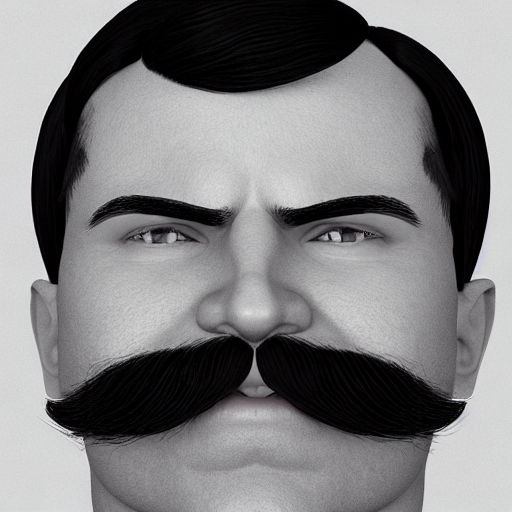

In [ ]:
image

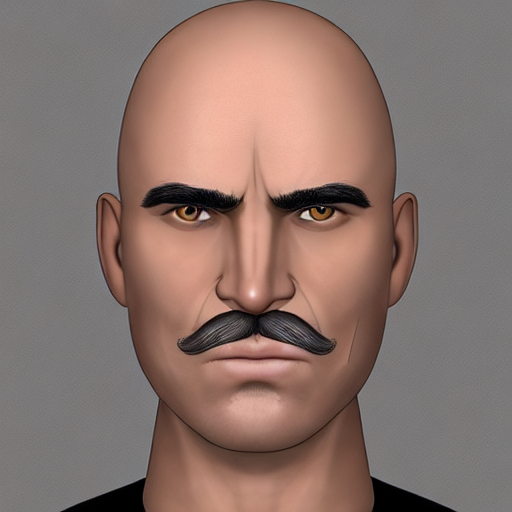

In [ ]:
image

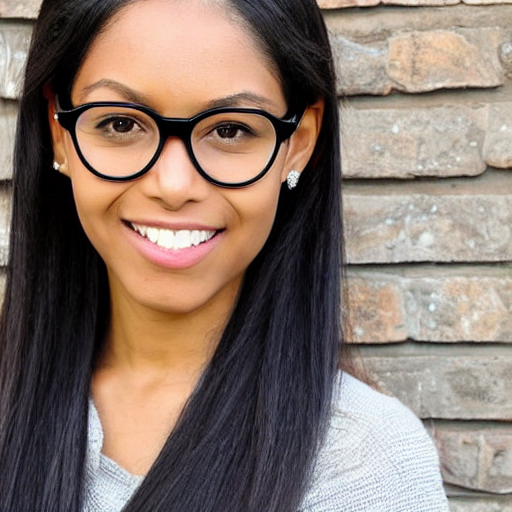

In [ ]:
image

Now for that image 2 image pipeline.. (Deva please jaller phuro errors sagle na asler phuro...)

🔍 Checking and patching LoRA keys if needed...
✅ Patched 192 keys and saved to: /content/drive/MyDrive/VisionMorph_LoRA_Final/adapter_model_fixed.safetensors

🔹 Loading VisionMorph LoRA for Editing...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py:214: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", dep

✅ VisionMorph LoRA loaded successfully!

🎨 Applying edit: The same woman but with a slightly smiling expression, add light freckles on her cheeks, and make her hair a bit shorter and curlier. Maintain realistic pencil sketch style.


  0%|          | 0/18 [00:00<?, ?it/s]

✅ Edited image saved at: /content/visionmorph_edited.png


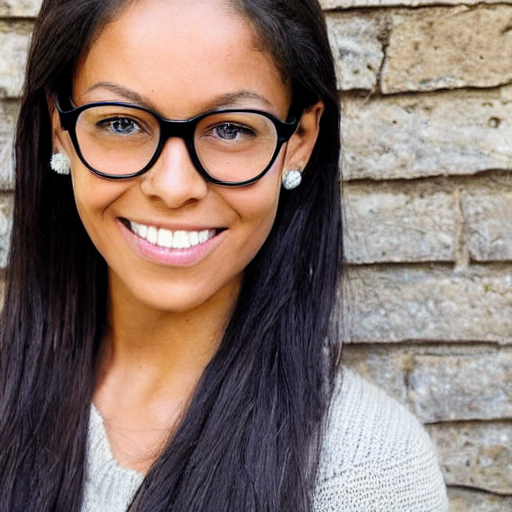

In [ ]:
# ======================================================
# ✅ VisionMorph Image Editing / Refinement (img2img)
# ======================================================
import torch
from diffusers import StableDiffusionImg2ImgPipeline
from safetensors.torch import load_file, save_file
from PIL import Image
import os, traceback

# -----------------------------
# PATHS
# -----------------------------
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
FIXED_FILE = os.path.join(LORA_DIR, "adapter_model_fixed.safetensors")
INPUT_IMAGE = "/content/visionmorph_output.png"  # your previously generated image
OUTPUT_EDITED = "/content/visionmorph_edited.png"

# -----------------------------
# PATCH KEYS (safely)
# -----------------------------
try:
    print("🔍 Checking and patching LoRA keys if needed...")
    weights = load_file(ADAPTER_FILE)
    new_weights = {}
    changed = 0
    for k, v in weights.items():
        new_k = k
        if "base_model.model." in k:
            new_k = k.replace("base_model.model.", "")
            changed += 1
        new_weights[new_k] = v
    save_file(new_weights, FIXED_FILE)
    print(f"✅ Patched {changed} keys and saved to: {FIXED_FILE}")
except Exception as e:
    print("⚠️ Could not patch LoRA file:", e)

# -----------------------------
# LOAD PIPELINE (IMG2IMG)
# -----------------------------
print("\n🔹 Loading VisionMorph LoRA for Editing...")
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
pipe.enable_attention_slicing()

print("✅ VisionMorph LoRA loaded successfully!")

# -----------------------------
# OPEN EXISTING IMAGE
# -----------------------------
init_image = Image.open(INPUT_IMAGE).convert("RGB").resize((512, 512))

# -----------------------------
# USER EDIT PROMPT
# -----------------------------
edit_prompt = (
    "The same woman but with a slightly smiling expression, add light freckles on her cheeks, "
    "and make her hair a bit shorter and curlier. Maintain realistic pencil sketch style."
)
negative_prompt = "blurry, distorted, unrealistic, low quality"

# -----------------------------
# GENERATE EDITED IMAGE
# -----------------------------
print(f"\n🎨 Applying edit: {edit_prompt}")
edited_image = pipe(
    prompt=edit_prompt,
    negative_prompt=negative_prompt,
    image=init_image,
    strength=0.45,   # 0.3 → subtle edit, 0.7 → stronger change
    guidance_scale=7.5,
    num_inference_steps=40,
).images[0]

# -----------------------------
# SAVE RESULT
# -----------------------------
edited_image.save(OUTPUT_EDITED)
print(f"✅ Edited image saved at: {OUTPUT_EDITED}")
edited_image


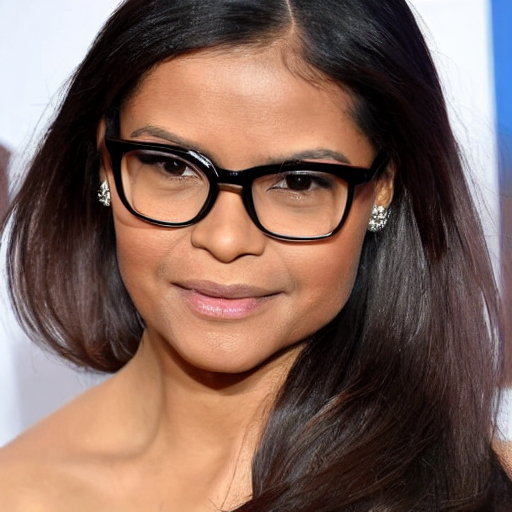

In [ ]:
image

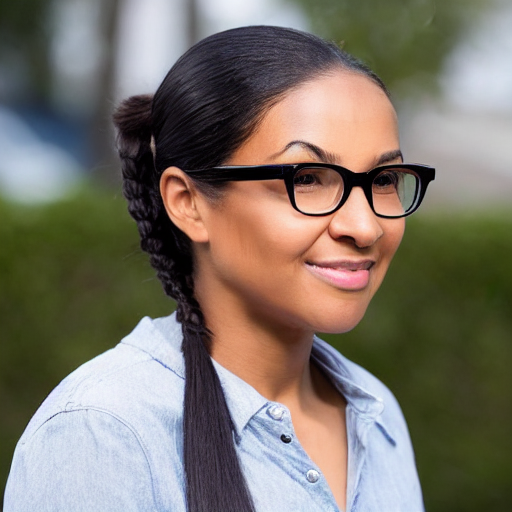

In [ ]:
image

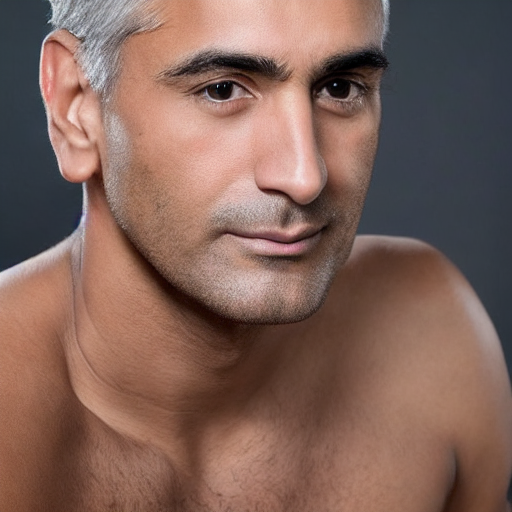

In [ ]:
image

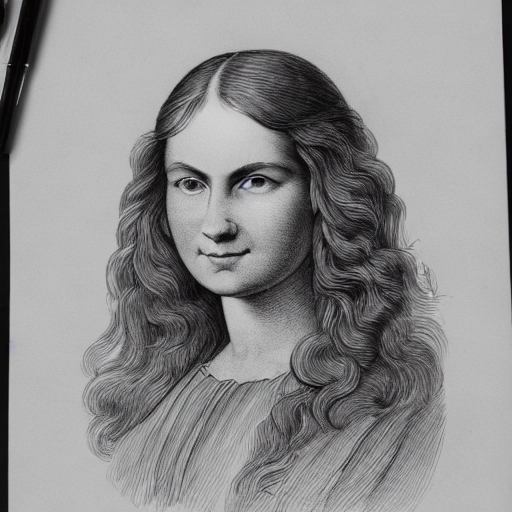

In [ ]:
image

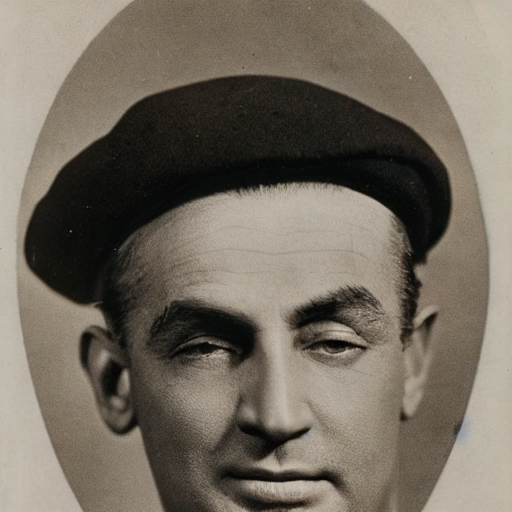

In [ ]:
image

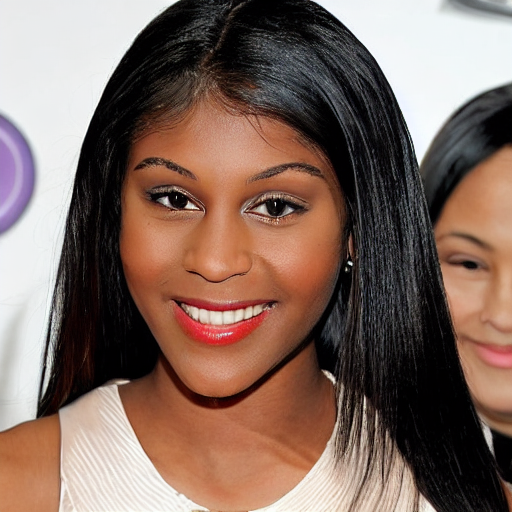

In [ ]:
image

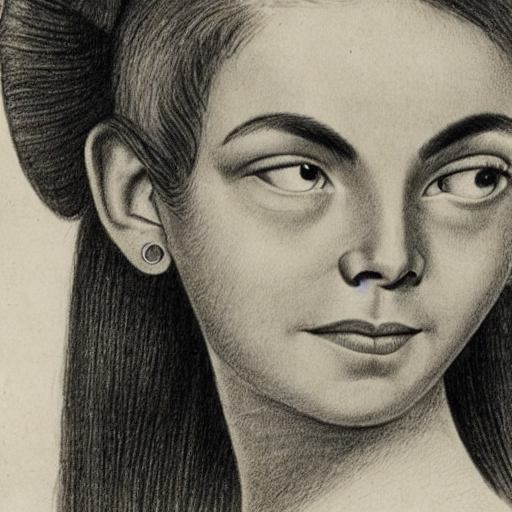

In [ ]:
image

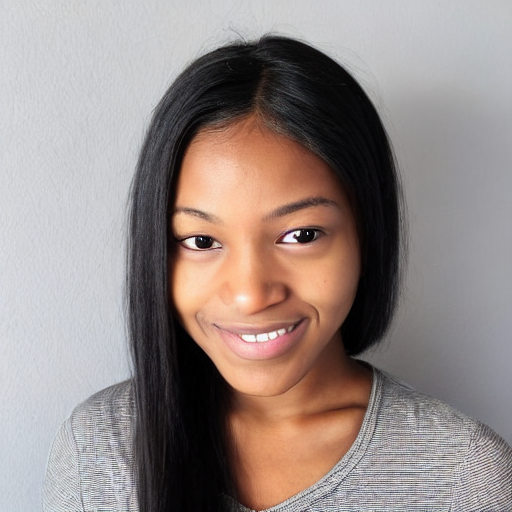

In [ ]:
image

**Now for the accuracy (it's not possible for a gen ai project to have an accuracy factor but.... sir wants it ... cant help...ufffff...ahhhhhh) so i am comparing real image with generated image**

In [ ]:
!pip install lpips scikit-image torchvision torch --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.8 MB/s eta 0:00:00


⬆️ Upload REAL (ground truth) image:


Saving WhatsApp Image 2025-11-12 at 11.03.46_34bd6b6e.jpg to WhatsApp Image 2025-11-12 at 11.03.46_34bd6b6e.jpg

⬆️ Upload GENERATED (VisionMorph output) image:


Saving download.png to download.png
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:02<00:00, 109MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth

📊 === VisionMorph Accuracy Report ===
🖼️ Real Image: WhatsApp Image 2025-11-12 at 11.03.46_34bd6b6e.jpg
🖼️ Generated Image: download.png

🔹 LPIPS (lower is better): 0.6338
🔹 SSIM  (higher is better): 0.0946
🔹 PSNR  (higher is better): 8.38 dB

🎯 Estimated Accuracy Score: 18.34%


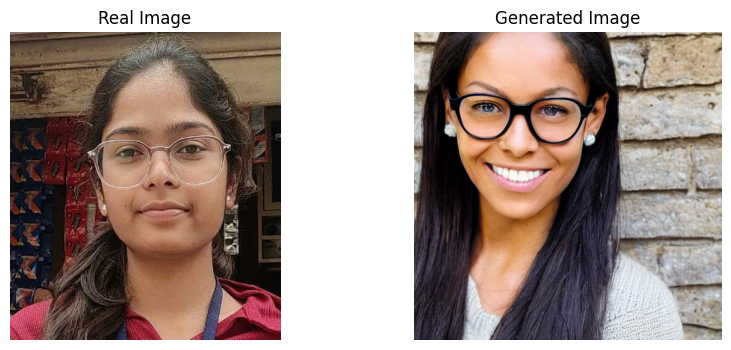

In [ ]:
# ==============================================
# ✅ VisionMorph Single-Image Accuracy Evaluation
# ==============================================



import torch
import torchvision.transforms as transforms
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
import lpips
from PIL import Image
import numpy as np
import io
from google.colab import files

# ----------------------------------------------
# STEP 1: Upload images
# ----------------------------------------------
print("⬆️ Upload REAL (ground truth) image:")
uploaded_real = files.upload()
real_name, real_bytes = next(iter(uploaded_real.items()))
real_image = Image.open(io.BytesIO(real_bytes))

print("\n⬆️ Upload GENERATED (VisionMorph output) image:")
uploaded_gen = files.upload()
gen_name, gen_bytes = next(iter(uploaded_gen.items()))
gen_image = Image.open(io.BytesIO(gen_bytes))

# ----------------------------------------------
# STEP 2: Compute metrics
# ----------------------------------------------
loss_fn = lpips.LPIPS(net='alex')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

def to_tensor(img):
    if img.mode != "RGB":
        img = img.convert("RGB")
    return transform(img).unsqueeze(0)

# Convert both images
real_t = to_tensor(real_image)
gen_t = to_tensor(gen_image)

# LPIPS
lpips_score = loss_fn(real_t, gen_t).item()

# SSIM and PSNR
real_np = np.array(real_image.resize((256, 256))).astype(np.float32) / 255.0
gen_np = np.array(gen_image.resize((256, 256))).astype(np.float32) / 255.0

ssim_score = ssim(real_np, gen_np, channel_axis=2, data_range=1.0)
psnr_score = psnr(real_np, gen_np, data_range=1.0)

# Combine into an overall "accuracy %" (just a readable normalized metric)
accuracy_percent = ((ssim_score * 0.5) + (min(psnr_score / 40, 1) * 0.3) + ((1 - lpips_score) * 0.2)) * 100

# ----------------------------------------------
# STEP 3: Display results
# ----------------------------------------------
print("\n📊 === VisionMorph Accuracy Report ===")
print(f"🖼️ Real Image: {real_name}")
print(f"🖼️ Generated Image: {gen_name}")
print(f"\n🔹 LPIPS (lower is better): {lpips_score:.4f}")
print(f"🔹 SSIM  (higher is better): {ssim_score:.4f}")
print(f"🔹 PSNR  (higher is better): {psnr_score:.2f} dB")
print(f"\n🎯 Estimated Accuracy Score: {accuracy_percent:.2f}%")

# Display both side by side
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
axs[0].imshow(real_image)
axs[0].set_title("Real Image")
axs[0].axis("off")

axs[1].imshow(gen_image)
axs[1].set_title("Generated Image")
axs[1].axis("off")
plt.show()


⬆️ Upload REAL (ground truth) image:


Saving Screenshot 2025-11-11 190140.png to Screenshot 2025-11-11 190140.png

⬆️ Upload GENERATED (VisionMorph output) image:


Saving Screenshot 2025-11-11 190721.png to Screenshot 2025-11-11 190721.png
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:04<00:00, 50.0MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth

📊 === VisionMorph Accuracy Report ===
🖼️ Real Image: Screenshot 2025-11-11 190140.png
🖼️ Generated Image: Screenshot 2025-11-11 190721.png

🔹 LPIPS (lower is better): 0.5124
🔹 SSIM  (higher is better): 0.4846
🔹 PSNR  (higher is better): 9.31 dB

🎯 Estimated Accuracy Score: 40.96%


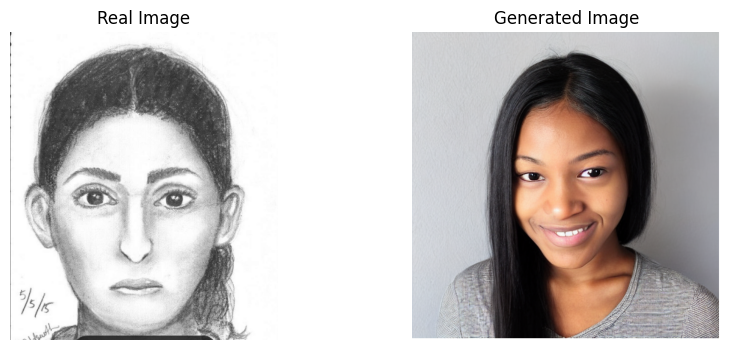

In [ ]:
# ==============================================
# ✅ VisionMorph Single-Image Accuracy Evaluation
# ==============================================



import torch
import torchvision.transforms as transforms
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
import lpips
from PIL import Image
import numpy as np
import io
from google.colab import files

# ----------------------------------------------
# STEP 1: Upload images
# ----------------------------------------------
print("⬆️ Upload REAL (ground truth) image:")
uploaded_real = files.upload()
real_name, real_bytes = next(iter(uploaded_real.items()))
real_image = Image.open(io.BytesIO(real_bytes))

print("\n⬆️ Upload GENERATED (VisionMorph output) image:")
uploaded_gen = files.upload()
gen_name, gen_bytes = next(iter(uploaded_gen.items()))
gen_image = Image.open(io.BytesIO(gen_bytes))

# ----------------------------------------------
# STEP 2: Compute metrics
# ----------------------------------------------
loss_fn = lpips.LPIPS(net='alex')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

def to_tensor(img):
    if img.mode != "RGB":
        img = img.convert("RGB")
    return transform(img).unsqueeze(0)

# Convert both images
real_t = to_tensor(real_image)
gen_t = to_tensor(gen_image)

# LPIPS
lpips_score = loss_fn(real_t, gen_t).item()

# SSIM and PSNR
real_np = np.array(real_image.resize((256, 256))).astype(np.float32) / 255.0
gen_np = np.array(gen_image.resize((256, 256))).astype(np.float32) / 255.0

ssim_score = ssim(real_np, gen_np, channel_axis=2, data_range=1.0)
psnr_score = psnr(real_np, gen_np, data_range=1.0)

# Combine into an overall "accuracy %" (just a readable normalized metric)
accuracy_percent = ((ssim_score * 0.5) + (min(psnr_score / 40, 1) * 0.3) + ((1 - lpips_score) * 0.2)) * 100

# ----------------------------------------------
# STEP 3: Display results
# ----------------------------------------------
print("\n📊 === VisionMorph Accuracy Report ===")
print(f"🖼️ Real Image: {real_name}")
print(f"🖼️ Generated Image: {gen_name}")
print(f"\n🔹 LPIPS (lower is better): {lpips_score:.4f}")
print(f"🔹 SSIM  (higher is better): {ssim_score:.4f}")
print(f"🔹 PSNR  (higher is better): {psnr_score:.2f} dB")
print(f"\n🎯 Estimated Accuracy Score: {accuracy_percent:.2f}%")

# Display both side by side
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
axs[0].imshow(real_image)
axs[0].set_title("Real Image")
axs[0].axis("off")

axs[1].imshow(gen_image)
axs[1].set_title("Generated Image")
axs[1].axis("off")
plt.show()


***BACKEND CONNCETION IS WHAT I AM TRYING NOW!!!!***

In [ ]:
# ============================================================
# ⭐ VisionMorph Backend API (Flask + Stable Diffusion + LoRA)
# ============================================================

!pip install flask flask_cors diffusers transformers accelerate safetensors cloudflare-ngrok --quiet




ERROR: Could not find a version that satisfies the requirement cloudflare-ngrok (from versions: none)
ERROR: No matching distribution found for cloudflare-ngrok


In [ ]:
!pip install flask flask-cors diffusers transformers accelerate safetensors --quiet

In [ ]:
%%writefile server.py
from flask import Flask, request, jsonify
from flask_cors import CORS
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
from safetensors.torch import load_file, save_file
from PIL import Image
import io, base64, os, traceback


# ===========================
# PATHS (UPDATE LORA PATH!)
# ===========================
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"  # <-- UPDATE IF NEEDED
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
FIXED_FILE = os.path.join(LORA_DIR, "adapter_model_fixed.safetensors")

# ============================================================
# PATCH KEYS AUTOMATICALLY
# ============================================================
try:
    print("🔍 Checking and patching LoRA keys...")
    weights = load_file(ADAPTER_FILE)
    new_weights = {}
    changed = 0
    for k, v in weights.items():
        new_k = k.replace("base_model.model.", "") if "base_model.model." in k else k
        if new_k != k: changed += 1
        new_weights[new_k] = v

    save_file(new_weights, FIXED_FILE)
    print(f"✅ Patched {changed} keys and saved → {FIXED_FILE}")

except Exception as e:
    print("⚠️ LoRA patch failed:", e)


# ============================================================
# LOAD TEXT-TO-IMAGE PIPELINE
# ============================================================
print("\n🔹 Loading VisionMorph text-to-image pipeline...")
pipe_t2i = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

try:
    pipe_t2i.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
    print("✅ LoRA attached to UNet (T2I)")
except:
    from peft import PeftModel
    pipe_t2i.unet = PeftModel.from_pretrained(pipe_t2i.unet, LORA_DIR, is_trainable=False)
    print("⚠️ Using PEFT fallback")

pipe_t2i.enable_attention_slicing()
pipe_t2i.enable_model_cpu_offload()


# ============================================================
# LOAD IMG2IMG PIPELINE
# ============================================================
print("\n🔹 Loading VisionMorph img2img pipeline...")
pipe_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe_i2i.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
pipe_i2i.enable_attention_slicing()

print("✅ Both pipelines ready!")


# ============================================================
# IMAGE ENCODER → base64
# ============================================================
def pil_to_base64(img):
    buff = io.BytesIO()
    img.save(buff, format="PNG")
    base64_str = base64.b64encode(buff.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{base64_str}"


# ============================================================
# FLASK APP
# ============================================================
app = Flask(__name__)
CORS(app)


# ============================================================
# POST /generate  → Generate new sketch
# ============================================================
@app.route("/generate", methods=["POST"])
def generate():
    try:
        data = request.json
        prompt = data.get("prompt", "")
        if not prompt:
            return jsonify({"error": "No prompt provided"}), 400

        print(f"\n🎨 Generating image for prompt:\n{prompt}")

        image = pipe_t2i(
            prompt=prompt,
            negative_prompt="blurry, distorted, low quality, artifacts",
            num_inference_steps=30,
            guidance_scale=7.5
        ).images[0]

        encoded = pil_to_base64(image)
        return jsonify({"image_base64": encoded})

    except Exception as e:
        traceback.print_exc()
        return jsonify({"error": str(e)}), 500



# ============================================================
# POST /edit  → Edit an existing sketch
# ============================================================
@app.route("/edit", methods=["POST"])
def edit():
    try:
        data = request.json
        edit_prompt = data.get("prompt", "")
        init_image_base64 = data.get("image_base64", "")

        if not edit_prompt or not init_image_base64:
            return jsonify({"error": "Missing prompt or image"}), 400

        # Decode base64 → image
        header, encoded = init_image_base64.split(",", 1)
        img_bytes = base64.b64decode(encoded)
        init_img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
        init_img = init_img.resize((512, 512))

        print(f"\n🖊️ Editing image with prompt: {edit_prompt}")

        edited_img = pipe_i2i(
            prompt=edit_prompt,
            negative_prompt="blurry, distorted, low quality",
            image=init_img,
            strength=0.45,
            guidance_scale=7.5,
            num_inference_steps=40
        ).images[0]

        encoded = pil_to_base64(edited_img)
        return jsonify({"image_base64": encoded})

    except Exception as e:
        traceback.print_exc()
        return jsonify({"error": str(e)}), 500




# ============================================================
# RUN SERVER
# ============================================================

if __name__ == "__main__":
    app.run(host="0.0.0.0", port=5000)


Overwriting server.py


In [ ]:
!pip install pyngrok --quiet


In [ ]:
!nohup python server.py > server_log.txt 2>&1 &


In [ ]:
from pyngrok import ngrok
ngrok.set_auth_token("2xMw8yvmojszIqoBu2ZwOstNB4c_57Jr3TrFi43QRGVaUA5eF")
public_url = ngrok.connect(5000)
public_url


<NgrokTunnel: "https://042d11bc6f5f.ngrok-free.app" -> "http://localhost:5000">

this is for that extra feature top 5


In [ ]:
import os

print(os.listdir("/content"))


['.config', 'drive', 'cufs.zip', 'cufs', 'sample_data']


In [ ]:
import os

os.rename("/content/archive (1).zip", "/content/cufs.zip")
print("Renamed successfully!")

FileNotFoundError: [Errno 2] No such file or directory: '/content/archive (1).zip' -> '/content/cufs.zip'

In [ ]:
import zipfile
import os

ZIP_PATH = "/content/cufs.zip"
EXTRACT_PATH = "/content/cufs"

with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
    zip_ref.extractall(EXTRACT_PATH)

print("✅ Extraction done")
print("Top-level folders:", os.listdir(EXTRACT_PATH))


✅ Extraction done
Top-level folders: ['original_sketch', 'sketches', 'cropped_sketch', 'sketch', 'photo', 'photo_points', 'sketch_points', 'photos']


In [ ]:
import os

SKETCH_DIR = "/content/cufs/sketches"   # 👈 IMPORTANT CHANGE

files = sorted(os.listdir(SKETCH_DIR))
print("Total sketch files:", len(files))
print("First 10 files:", files[:10])


Total sketch files: 188
First 10 files: ['F2-005-01-sz1.jpg', 'F2-006-01-sz1.jpg', 'F2-007-01-sz1.jpg', 'F2-008-01-sz1.jpg', 'F2-009-01-sz1.jpg', 'F2-010-01-sz1.jpg', 'F2-011-01-sz1.jpg', 'F2-012-01-sz1.jpg', 'F2-013-01-sz1.jpg', 'F2-014-01-sz1.jpg']


In [ ]:
!pip install deepface==0.0.79 opencv-python-headless tensorflow keras numpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 84.0 MB/s eta 0:00:00


In [ ]:
!pip install git+https://github.com/serengil/deepface.git

  Cloning https://github.com/serengil/deepface.git to /tmp/pip-req-build-cn82xhwv
  Running command git clone --filter=blob:none --quiet https://github.com/serengil/deepface.git /tmp/pip-req-build-cn82xhwv
  Resolved https://github.com/serengil/deepface.git to commit 7331048e215e15b4ad51f579dc1c69c5be2b30c4
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.0/297.0 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.1/250.1 kB 5.5 MB/s eta 0:00:00
  Created wheel for deepface: filename=deepface-0.0.96-py3-none-any.whl size=137020 sha256=39651f49868252308e96ff2c5f55c23b82ef9106e67df6c4f8513359160623d1
  Stored in directory: /tmp/pip-ephem-wheel-cache-vux8mp7k/wheels/5d/dd/70/30b6bf36629ca603ab267531

In [ ]:
from deepface import DeepFace
print("✅ DeepFace imported successfully")


25-12-14 05:13:34 - Directory /root/.deepface has been created
25-12-14 05:13:34 - Directory /root/.deepface/weights has been created
✅ DeepFace imported successfully


In [ ]:
import os
import pickle
import numpy as np
from deepface import DeepFace
from PIL import Image

SKETCH_DIR = "/content/cufs/sketches"
OUTPUT_FILE = "criminal_embeddings.pkl"

embeddings = []
files = []

print("🔍 Processing sketches...")

for fname in sorted(os.listdir(SKETCH_DIR)):
    if not fname.lower().endswith(".jpg"):
        continue

    img_path = os.path.join(SKETCH_DIR, fname)

    try:
        rep = DeepFace.represent(
            img_path=img_path,
            model_name="Facenet512",
            enforce_detection=False
        )

        emb = np.array(rep[0]["embedding"])
        embeddings.append(emb)
        files.append(fname)

    except Exception as e:
        print("❌ Failed:", fname, e)

print(f"\n✅ Total embeddings created: {len(embeddings)}")

# Save embeddings
with open(OUTPUT_FILE, "wb") as f:
    pickle.dump(
        {
            "embeddings": embeddings,
            "files": files
        },
        f
    )

print("💾 Saved embeddings to", OUTPUT_FILE)


25-12-14 06:34:46 - Directory /root/.deepface has been created
25-12-14 06:34:46 - Directory /root/.deepface/weights has been created
🔍 Processing sketches...


FileNotFoundError: [Errno 2] No such file or directory: '/content/cufs/sketches'

In [ ]:
import pickle
import numpy as np

with open("criminal_embeddings.pkl", "rb") as f:
    data = pickle.load(f)

db_embeddings = np.array(data["embeddings"])
db_files = data["files"]

print("Embeddings shape:", db_embeddings.shape)
print("Total files:", len(db_files))


FileNotFoundError: [Errno 2] No such file or directory: 'criminal_embeddings.pkl'

(np.float64(-0.5), np.float64(199.5), np.float64(249.5), np.float64(-0.5))

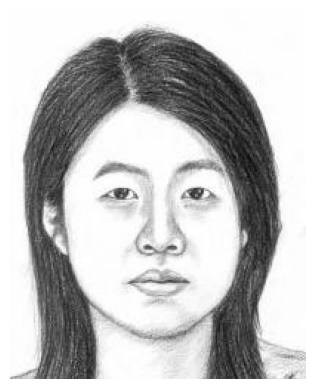

In [ ]:
from deepface import DeepFace
from PIL import Image
import matplotlib.pyplot as plt
import os

QUERY_IMAGE = "/content/cufs/sketches/F2-010-01-sz1.jpg"  # you can change later

img = Image.open(QUERY_IMAGE).convert("RGB")
plt.imshow(img)
plt.axis("off")


In [ ]:
rep = DeepFace.represent(
    img_path=QUERY_IMAGE,
    model_name="Facenet512",
    enforce_detection=False
)

query_emb = np.array(rep[0]["embedding"])
print("Query embedding shape:", query_emb.shape)


Query embedding shape: (512,)


In [ ]:
def cosine_similarity(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

scores = []
for emb in db_embeddings:
    scores.append(cosine_similarity(query_emb, emb))

scores = np.array(scores)

top5_idx = scores.argsort()[-5:][::-1]

print("\n🔎 TOP 5 MATCHES:\n")
for rank, idx in enumerate(top5_idx, 1):
    print(
        f"{rank}. {db_files[idx]}  →  similarity: {scores[idx]*100:.2f}%"
    )



🔎 TOP 5 MATCHES:

1. F2-010-01-sz1.jpg  →  similarity: 100.00%
2. F2-014-01-sz1.jpg  →  similarity: 84.73%
3. F2-006-01-sz1.jpg  →  similarity: 84.66%
4. F2-021-01-sz1.jpg  →  similarity: 82.49%
5. F2-027-01-sz1.jpg  →  similarity: 82.49%


In [ ]:
def search_top_k(query_image_path, k=5):
    rep = DeepFace.represent(
        img_path=query_image_path,
        model_name="Facenet512",
        enforce_detection=False
    )
    query_emb = np.array(rep[0]["embedding"])

    scores = []
    for emb in db_embeddings:
        scores.append(cosine_similarity(query_emb, emb))

    scores = np.array(scores)
    top_idx = scores.argsort()[-k:][::-1]

    results = []
    for idx in top_idx:
        results.append({
            "file": db_files[idx],
            "similarity": round(scores[idx] * 100, 2)
        })

    return results


In [ ]:
results = search_top_k("/content/cufs/sketches/F2-010-01-sz1.jpg")

for r in results:
    print(r)


{'file': 'F2-010-01-sz1.jpg', 'similarity': np.float64(100.0)}
{'file': 'F2-014-01-sz1.jpg', 'similarity': np.float64(84.73)}
{'file': 'F2-006-01-sz1.jpg', 'similarity': np.float64(84.66)}
{'file': 'F2-021-01-sz1.jpg', 'similarity': np.float64(82.49)}
{'file': 'F2-027-01-sz1.jpg', 'similarity': np.float64(82.49)}


In [ ]:
from google.colab import drive
drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.makedirs("/content/drive/MyDrive/VisionMorph", exist_ok=True)


In [ ]:
import shutil

shutil.move(
    "/content/criminal_embeddings.pkl",
    "/content/drive/MyDrive/VisionMorph/criminal_embeddings.pkl"
)

print("✅ Saved embeddings to Drive")


✅ Saved embeddings to Drive


In [ ]:
import pickle

with open("/content/drive/MyDrive/VisionMorph/criminal_embeddings.pkl", "rb") as f:
    data = pickle.load(f)

print(len(data["embeddings"]), "embeddings loaded successfully")


188 embeddings loaded successfully


In [ ]:
!pip install flask flask-cors diffusers transformers accelerate safetensors --quiet

In [ ]:
%%writefile server.py
from flask import Flask, request, jsonify
from flask_cors import CORS
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
from safetensors.torch import load_file, save_file
from PIL import Image
import io, base64, os, traceback

# 🔹 NEW IMPORTS (SAFE)
import numpy as np
import pickle
from deepface import DeepFace


# ===========================
# PATHS (UPDATE LORA PATH!)
# ===========================
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
FIXED_FILE = os.path.join(LORA_DIR, "adapter_model_fixed.safetensors")

# ============================================================
# PATCH KEYS AUTOMATICALLY
# ============================================================
try:
    print("🔍 Checking and patching LoRA keys...")
    weights = load_file(ADAPTER_FILE)
    new_weights = {}
    changed = 0
    for k, v in weights.items():
        new_k = k.replace("base_model.model.", "") if "base_model.model." in k else k
        if new_k != k:
            changed += 1
        new_weights[new_k] = v

    save_file(new_weights, FIXED_FILE)
    print(f"✅ Patched {changed} keys and saved → {FIXED_FILE}")

except Exception as e:
    print("⚠️ LoRA patch failed:", e)


# ============================================================
# LOAD TEXT-TO-IMAGE PIPELINE
# ============================================================
print("\n🔹 Loading VisionMorph text-to-image pipeline...")
pipe_t2i = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

try:
    pipe_t2i.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
    print("✅ LoRA attached to UNet (T2I)")
except:
    from peft import PeftModel
    pipe_t2i.unet = PeftModel.from_pretrained(pipe_t2i.unet, LORA_DIR, is_trainable=False)
    print("⚠️ Using PEFT fallback")

pipe_t2i.enable_attention_slicing()
pipe_t2i.enable_model_cpu_offload()


# ============================================================
# LOAD IMG2IMG PIPELINE
# ============================================================
print("\n🔹 Loading VisionMorph img2img pipeline...")
pipe_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe_i2i.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
pipe_i2i.enable_attention_slicing()

print("✅ Both pipelines ready!")


# ============================================================
# IMAGE ENCODER → base64
# ============================================================
def pil_to_base64(img):
    buff = io.BytesIO()
    img.save(buff, format="PNG")
    base64_str = base64.b64encode(buff.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{base64_str}"


# ============================================================
# FLASK APP
# ============================================================
app = Flask(__name__)
CORS(app)


# ============================================================
# 🔍 LOAD CRIMINAL EMBEDDINGS (ONCE)
# ============================================================
EMBEDDING_PATH = "/content/drive/MyDrive/VisionMorph/criminal_embeddings.pkl"

try:
    with open(EMBEDDING_PATH, "rb") as f:
        data = pickle.load(f)

    db_embeddings = np.array(data["embeddings"])
    db_files = data["files"]

    print(f"🔎 Loaded {len(db_embeddings)} criminal embeddings")

except Exception as e:
    print("❌ Failed to load embeddings:", e)
    db_embeddings = []
    db_files = []


def get_embedding_for_image(image_pil):
    """Convert PIL image to FaceNet512 embedding"""
    try:
        temp_path = "/content/temp_input.png"
        image_pil.save(temp_path)

        rep = DeepFace.represent(
            img_path=temp_path,
            model_name="Facenet512",
            enforce_detection=False
        )

        return np.array(rep[0]["embedding"])

    except Exception as e:
        print("❌ Embedding error:", e)
        return None


# ============================================================
# POST /generate → Generate new sketch
# ============================================================
@app.route("/generate", methods=["POST"])
def generate():
    try:
        data = request.json
        prompt = data.get("prompt", "")
        if not prompt:
            return jsonify({"error": "No prompt provided"}), 400

        print(f"\n🎨 Generating image for prompt:\n{prompt}")

        image = pipe_t2i(
            prompt=prompt,
            negative_prompt="blurry, distorted, low quality, artifacts",
            num_inference_steps=30,
            guidance_scale=7.5
        ).images[0]

        encoded = pil_to_base64(image)
        return jsonify({"image_base64": encoded})

    except Exception as e:
        traceback.print_exc()
        return jsonify({"error": str(e)}), 500


# ============================================================
# POST /edit → Edit an existing sketch
# ============================================================
@app.route("/edit", methods=["POST"])
def edit():
    try:
        data = request.json
        edit_prompt = data.get("prompt", "")
        init_image_base64 = data.get("image_base64", "")

        if not edit_prompt or not init_image_base64:
            return jsonify({"error": "Missing prompt or image"}), 400

        header, encoded = init_image_base64.split(",", 1)
        img_bytes = base64.b64decode(encoded)
        init_img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
        init_img = init_img.resize((512, 512))

        print(f"\n🖊️ Editing image with prompt: {edit_prompt}")

        edited_img = pipe_i2i(
            prompt=edit_prompt,
            negative_prompt="blurry, distorted, low quality",
            image=init_img,
            strength=0.45,
            guidance_scale=7.5,
            num_inference_steps=40
        ).images[0]

        encoded = pil_to_base64(edited_img)
        return jsonify({"image_base64": encoded})

    except Exception as e:
        traceback.print_exc()
        return jsonify({"error": str(e)}), 500


# ============================================================
# 🔍 POST /search_criminals → FIND SIMILAR SKETCHES
# ============================================================
@app.route("/search_criminals", methods=["POST"])
def search_criminals():
    try:
        payload = request.json
        img_b64 = payload.get("image", "")

        if not img_b64:
            return jsonify({"error": "No image provided"}), 400

        img_bytes = base64.b64decode(img_b64.split(",")[-1])
        image = Image.open(io.BytesIO(img_bytes)).convert("RGB")

        query_emb = get_embedding_for_image(image)
        if query_emb is None:
            return jsonify({"error": "Embedding failed"}), 500

        sims = np.dot(db_embeddings, query_emb) / (
            np.linalg.norm(db_embeddings, axis=1) * np.linalg.norm(query_emb)
        )

        top5_idx = sims.argsort()[-5:][::-1]

        results = []
        for i in top5_idx:
            results.append({
                "file": db_files[i],
                "similarity": round(float(sims[i] * 100), 2)
            })

        return jsonify({"matches": results})

    except Exception as e:
        print("❌ Search error:", e)
        return jsonify({"error": str(e)}), 500


# ============================================================
# RUN SERVER
# ============================================================
if __name__ == "__main__":
    app.run(host="0.0.0.0", port=5000)


Writing server.py


In [ ]:
!python server.py


E0000 00:00:1765690268.460808    7305 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765690268.493541    7305 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1765690268.578619    7305 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765690268.578661    7305 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765690268.578669    7305 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765690268.578676    7305 computation_placer.cc:177] computation placer already registered. Please check linka

In [ ]:
!pip install pyngrok --quiet


In [ ]:
!nohup python server.py > server_log.txt 2>&1 &


In [ ]:
!pip install pyngrok --quiet
from pyngrok import ngrok
ngrok.set_auth_token("2xMw8yvmojszIqoBu2ZwOstNB4c_57Jr3TrFi43QRGVaUA5eF")
public_url = ngrok.connect(5000)
public_url


ModuleNotFoundError: No module named 'pyngrok'

**Trying once again the top 5 features please God let it work this time .... Be with me!**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

BASE_DIR = "/content/drive/MyDrive/VisionMorph"
DATA_DIR = os.path.join(BASE_DIR, "dataset")
EMB_DIR = os.path.join(BASE_DIR, "embeddings")

os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(EMB_DIR, exist_ok=True)

print("✅ Folder structure ready:")
print(BASE_DIR)
print(DATA_DIR)
print(EMB_DIR)


✅ Folder structure ready:
/content/drive/MyDrive/VisionMorph
/content/drive/MyDrive/VisionMorph/dataset
/content/drive/MyDrive/VisionMorph/embeddings


In [ ]:
import os

DATA_DIR = "/content/drive/MyDrive/VisionMorph/dataset"
print(os.listdir(DATA_DIR))


['cufs.zip']


In [ ]:
import zipfile
import os

ZIP_PATH = "/content/drive/MyDrive/VisionMorph/dataset/cufs.zip"
EXTRACT_PATH = "/content/drive/MyDrive/VisionMorph/dataset/cufs"

# Create extract folder if not exists
os.makedirs(EXTRACT_PATH, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
    zip_ref.extractall(EXTRACT_PATH)

print("✅ Extraction completed!")
print("📂 Top-level folders:")
print(os.listdir(EXTRACT_PATH))


✅ Extraction completed!
📂 Top-level folders:
['cropped_sketch', 'original_sketch', 'photo', 'photo_points', 'photos', 'sketch', 'sketch_points', 'sketches']


In [ ]:
!pip install -q deepface opencv-python-headless tqdm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.0/297.0 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.1/250.1 kB 13.6 MB/s eta 0:00:00


In [ ]:
import os
import pickle
import numpy as np
from deepface import DeepFace
from tqdm import tqdm

SKETCH_DIR = "/content/drive/MyDrive/VisionMorph/dataset/cufs/sketches"
SAVE_PATH = "/content/drive/MyDrive/VisionMorph/embeddings/criminal_embeddings.pkl"

os.makedirs(os.path.dirname(SAVE_PATH), exist_ok=True)

embeddings = []
files = []

print("🔍 Processing sketch images...")

for file in tqdm(sorted(os.listdir(SKETCH_DIR))):
    if not file.lower().endswith(".jpg"):
        continue

    img_path = os.path.join(SKETCH_DIR, file)

    try:
        rep = DeepFace.represent(
            img_path,
            model_name="Facenet512",
            enforce_detection=False
        )

        embeddings.append(rep[0]["embedding"])
        files.append(file)

    except Exception as e:
        print("❌ Skipped:", file, "|", e)

data = {
    "embeddings": np.array(embeddings),
    "files": files
}

with open(SAVE_PATH, "wb") as f:
    pickle.dump(data, f)

print(f"\n✅ DONE!")
print(f"🧠 Total embeddings saved: {len(embeddings)}")
print(f"💾 Saved at: {SAVE_PATH}")


25-12-17 00:31:05 - Directory /root/.deepface has been created
25-12-17 00:31:05 - Directory /root/.deepface/weights has been created
🔍 Processing sketch images...


  0%|          | 0/188 [00:00<?, ?it/s]

25-12-17 00:31:20 - 🔗 facenet512_weights.h5 will be downloaded from https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5 to /root/.deepface/weights/facenet512_weights.h5...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5
To: /root/.deepface/weights/facenet512_weights.h5

  0%|          | 0.00/95.0M [00:00<?, ?B/s]
 12%|█▏        | 11.0M/95.0M [00:00<00:00, 85.3MB/s]
 23%|██▎       | 22.0M/95.0M [00:00<00:00, 95.9MB/s]
 35%|███▌      | 33.6M/95.0M [00:00<00:00, 95.3MB/s]
 47%|████▋     | 44.6M/95.0M [00:00<00:00, 101MB/s] 
 60%|██████    | 57.1M/95.0M [00:00<00:00, 107MB/s]
 72%|███████▏  | 68.2M/95.0M [00:00<00:00, 102MB/s]
100%|██████████| 95.0M/95.0M [00:00<00:00, 105MB/s]
100%|██████████| 188/188 [01:54<00:00,  1.64it/s]


✅ DONE!
🧠 Total embeddings saved: 188
💾 Saved at: /content/drive/MyDrive/VisionMorph/embeddings/criminal_embeddings.pkl


In [1]:
!pip install -q deepface opencv-python-headless tqdm --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.0/297.0 kB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.1/250.1 kB 17.1 MB/s eta 0:00:00


In [2]:
!pip install flask flask-cors diffusers transformers accelerate safetensors --quiet

In [3]:
%%writefile server.py
from flask import Flask, request, jsonify
from flask_cors import CORS
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
from safetensors.torch import load_file, save_file
from PIL import Image
import io, base64, os, traceback


# ===========================
# PATHS (UPDATE LORA PATH!)
# ===========================
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_DIR = "/content/drive/MyDrive/VisionMorph_LoRA_Final"  # <-- UPDATE IF NEEDED
ADAPTER_FILE = os.path.join(LORA_DIR, "adapter_model.safetensors")
FIXED_FILE = os.path.join(LORA_DIR, "adapter_model_fixed.safetensors")

# ============================================================
# PATCH KEYS AUTOMATICALLY
# ============================================================
try:
    print("🔍 Checking and patching LoRA keys...")
    weights = load_file(ADAPTER_FILE)
    new_weights = {}
    changed = 0
    for k, v in weights.items():
        new_k = k.replace("base_model.model.", "") if "base_model.model." in k else k
        if new_k != k: changed += 1
        new_weights[new_k] = v

    save_file(new_weights, FIXED_FILE)
    print(f"✅ Patched {changed} keys and saved → {FIXED_FILE}")

except Exception as e:
    print("⚠️ LoRA patch failed:", e)


# ============================================================
# LOAD TEXT-TO-IMAGE PIPELINE
# ============================================================
print("\n🔹 Loading VisionMorph text-to-image pipeline...")
pipe_t2i = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

try:
    pipe_t2i.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
    print("✅ LoRA attached to UNet (T2I)")
except:
    from peft import PeftModel
    pipe_t2i.unet = PeftModel.from_pretrained(pipe_t2i.unet, LORA_DIR, is_trainable=False)
    print("⚠️ Using PEFT fallback")

pipe_t2i.enable_attention_slicing()
pipe_t2i.enable_model_cpu_offload()


# ============================================================
# LOAD IMG2IMG PIPELINE
# ============================================================
print("\n🔹 Loading VisionMorph img2img pipeline...")
pipe_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe_i2i.unet.load_attn_procs(LORA_DIR, weight_name="adapter_model_fixed.safetensors")
pipe_i2i.enable_attention_slicing()

print("✅ Both pipelines ready!")


# ============================================================
# IMAGE ENCODER → base64
# ============================================================

def pil_to_base64(img):
    """
    Convert PIL Image → base64 string
    """
    buff = io.BytesIO()
    img.save(buff, format="PNG")
    base64_str = base64.b64encode(buff.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{base64_str}"


def image_file_to_base64(image_path):
    """
    Convert image file path → base64 string
    """
    try:
        img = Image.open(image_path).convert("RGB")
        buff = io.BytesIO()
        img.save(buff, format="PNG")
        base64_str = base64.b64encode(buff.getvalue()).decode("utf-8")
        return f"data:image/png;base64,{base64_str}"
    except Exception as e:
        print("❌ Image load failed:", image_path, e)
        return None



# ============================================================
# FLASK APP
# ============================================================
app = Flask(__name__)
# CORS(app)
# because this was blocking so i(siona) am adding cors() extended and after request
CORS(
    app,
    resources={r"/*": {"origins": "*"}},
    supports_credentials=True,
    allow_headers=["Content-Type", "Authorization"],
    methods=["GET", "POST", "OPTIONS"]
)

@app.after_request
def after_request(response):
    response.headers.add("Access-Control-Allow-Origin", "*")
    response.headers.add("Access-Control-Allow-Headers", "Content-Type,Authorization")
    response.headers.add("Access-Control-Allow-Methods", "GET,POST,OPTIONS")
    return response


# ==========================================================
# 🔍 LOAD CRIMINAL EMBEDDINGS (ONCE)
# ==========================================================
import numpy as np
import pickle
from deepface import DeepFace

EMBEDDINGS_PATH = "/content/drive/MyDrive/VisionMorph/embeddings/criminal_embeddings.pkl"

try:
    with open(EMBEDDINGS_PATH, "rb") as f:
        data = pickle.load(f)

    db_embeddings = np.array(data["embeddings"])
    db_files = data["files"]

    print(f"🔎 Loaded {len(db_embeddings)} criminal embeddings")

except Exception as e:
    print("❌ Failed to load criminal embeddings:", e)
    db_embeddings = []
    db_files = []

def get_embedding_from_pil(image_pil):
    try:
        temp_path = "/content/query_image.png"
        image_pil.save(temp_path)

        rep = DeepFace.represent(
            temp_path,
            model_name="Facenet512",
            enforce_detection=False
        )

        return np.array(rep[0]["embedding"])

    except Exception as e:
        print("❌ Query embedding error:", e)
        return None

# ============================================================
# POST /generate  → Generate new sketch
# ============================================================
@app.route("/generate", methods=["POST"])
def generate():
    try:
        data = request.json
        prompt = data.get("prompt", "")
        if not prompt:
            return jsonify({"error": "No prompt provided"}), 400

        print(f"\n🎨 Generating image for prompt:\n{prompt}")

        image = pipe_t2i(
            prompt=prompt,
            negative_prompt="blurry, distorted, low quality, artifacts",
            num_inference_steps=30,
            guidance_scale=7.5
        ).images[0]

        encoded = pil_to_base64(image)
        return jsonify({"image_base64": encoded})

    except Exception as e:
        traceback.print_exc()
        return jsonify({"error": str(e)}), 500



# ============================================================
# POST /edit  → Edit an existing sketch
# ============================================================
@app.route("/edit", methods=["POST"])
def edit():
    try:
        data = request.json
        edit_prompt = data.get("prompt", "")
        init_image_base64 = data.get("image_base64", "")

        if not edit_prompt or not init_image_base64:
            return jsonify({"error": "Missing prompt or image"}), 400

        # Decode base64 → image
        header, encoded = init_image_base64.split(",", 1)
        img_bytes = base64.b64decode(encoded)
        init_img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
        init_img = init_img.resize((512, 512))

        print(f"\n🖊️ Editing image with prompt: {edit_prompt}")

        edited_img = pipe_i2i(
            prompt=edit_prompt,
            negative_prompt="blurry, distorted, low quality",
            image=init_img,
            strength=0.45,
            guidance_scale=7.5,
            num_inference_steps=40
        ).images[0]

        encoded = pil_to_base64(edited_img)
        return jsonify({"image_base64": encoded})

    except Exception as e:
        traceback.print_exc()
        return jsonify({"error": str(e)}), 500


# ==========================================================
# 🔍 SEARCH CRIMINAL DATABASE
# ==========================================================


@app.route("/search_criminals", methods=["POST"])
def search_criminals():
    try:
        data = request.json
        image_b64 = data.get("image", "")

        if not image_b64:
            return jsonify({"error": "No image provided"}), 400

        # Decode base64 → PIL
        img_bytes = base64.b64decode(image_b64.split(",")[-1])
        image = Image.open(io.BytesIO(img_bytes)).convert("RGB")

        query_embedding = get_embedding_from_pil(image)
        if query_embedding is None:
            return jsonify({"error": "Embedding generation failed"}), 500

        similarities = np.dot(db_embeddings, query_embedding) / (
            np.linalg.norm(db_embeddings, axis=1) * np.linalg.norm(query_embedding)
        )

        top5_idx = similarities.argsort()[-5:][::-1]

        results = []
        for idx in top5_idx:
            img_path = os.path.join(
                "/content/drive/MyDrive/VisionMorph/dataset/cufs/sketches",
                db_files[idx]
            )

            results.append({
                "id": db_files[idx].replace(".jpg", ""),
                "image": image_file_to_base64(img_path),
                "similarity": round(float(similarities[idx] * 100), 2)
            })


        return jsonify({"matches": results})

    except Exception as e:
        print("❌ Search error:", e)
        return jsonify({"error": str(e)}), 500



# ============================================================
# RUN SERVER
# ============================================================

if __name__ == "__main__":
    app.run(host="0.0.0.0", port=5000)


Writing server.py


In [4]:
!nohup python server.py > server_log.txt 2>&1 &

In [ ]:

import requests

url = "http://127.0.0.1:5000/search_criminals"

# use ANY base64 image you already generated
payload = {
    "image": "F2-010-01-sz1.jpg"
}

res = requests.post(url, json=payload)
print(res.json())


{'error': 'Invalid base64-encoded string: number of data characters (13) cannot be 1 more than a multiple of 4'}


In [5]:
!pip install pyngrok --quiet

In [6]:

from pyngrok import ngrok
ngrok.set_auth_token("2xMw8yvmojszIqoBu2ZwOstNB4c_57Jr3TrFi43QRGVaUA5eF")
public_url = ngrok.connect(5000)
public_url


<NgrokTunnel: "https://bfdd89964984.ngrok-free.app" -> "http://localhost:5000">

In [7]:
!ls /content/drive/MyDrive/VisionMorph/dataset/cufs


cropped_sketch	 photo	       photos  sketches
original_sketch  photo_points  sketch  sketch_points
